In [656]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
from cr_data_inspection_functions import *
from lwa_antpos import reading
import scipy.stats as st
import math
import yaml
import os
import numpy.lib.recfunctions as rfn
import scipy.signal as sg
import astropy.time
import astropy.coordinates
import astropy.units as u

In [657]:
driftcurveNS73=np.loadtxt('/home/kplant/driftcurve_ovro_NS_73.00.txt')
driftcurveEW73=np.loadtxt('/home/kplant/driftcurve_ovro_EW_73.00.txt')

print(driftcurveEW73.shape)
print(driftcurveNS73.shape)

(144, 2)
(144, 2)


Text(0.5, 1.0, '73 MHz')

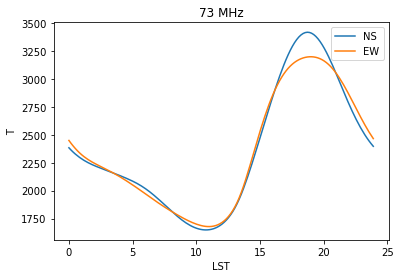

In [293]:
plt.plot(driftcurveNS73[:,0],driftcurveNS73[:,1],label='NS')
plt.plot(driftcurveEW73[:,0],driftcurveEW73[:,1],label='EW')
plt.legend()
plt.ylabel('T')
plt.xlabel('LST')
plt.title('73 MHz')

Text(0.5, 0, 'LST')

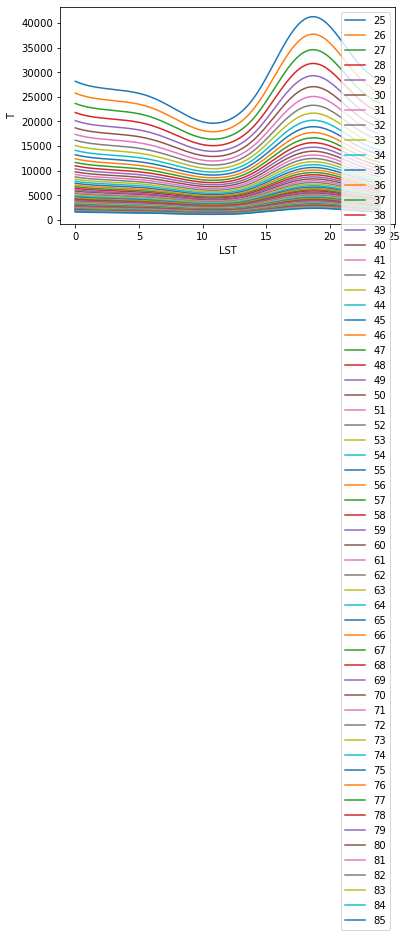

In [294]:
frequencies=np.asarray(range(25,86))
#print(frequencies)
for f in frequencies:
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_NS_'+str(f)+'.00.txt')
    plt.plot(driftcurve[:,0],driftcurve[:,1],label=str(f))
    #plt.plot(driftcurve[:,0],driftcurve[:,1],label='EW')
    
plt.legend()
plt.ylabel('T')
plt.xlabel('LST')


Text(0.5, 0, 'frequency [MHz]')

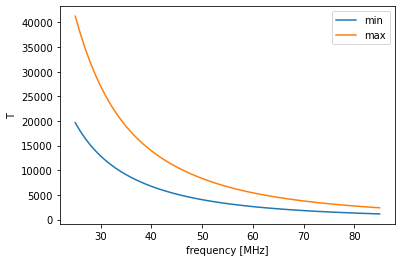

In [651]:
frequencies=np.asarray(range(25,86))
#print(frequencies)
maxs=[]
mins=[]
for f in frequencies:
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_NS_'+str(f)+'.00.txt')
    maxs.append(np.max(driftcurve[:,1]))
    mins.append(np.min(driftcurve[:,1]))
plt.plot(frequencies,mins,label='min')
plt.plot(frequencies,maxs,label='max')

plt.legend()
plt.ylabel('T')
plt.xlabel('frequency [MHz]')

In [655]:
print(frequencies[5],maxs[5],maxs[6])
print((maxs[5]-maxs[6])/maxs[6])

30 27055.895733936566 25068.089094907715
0.07929629703736177


# Weighted Average across frequencies
I compare several weighting functions, including tophats with different cutoffs as well as the bandpass FIR used in the software and firmware.

In [296]:
# Define a tophat function
def tophat(start,stop,f):
    weights_raw=np.multiply(f<stop,f>start)
    weights_normed=weights_raw/np.sum(weights_raw)
    return weights_normed



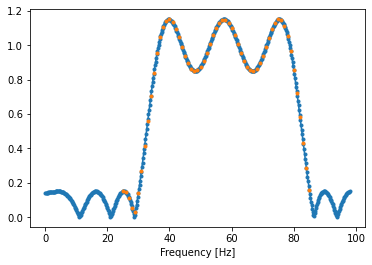

In [297]:
#load the bandpass and interpolate to the set of frequencies for which I've generated sky models

config='/lustre/kplant/2024May15-dataproducts/config_preliminary_cuts.yml'  #most recent config will be appropriate for all? 
with open(config, 'r') as file:
    configuration=yaml.safe_load(file)
fs= 196 #MHz

# plot the frequency response -- taken from the pydsr tutorial https://pysdr.org/content/filters.html
H = np.abs(np.fft.fft(h, 1024)) # take the 1024-point FFT and magnitude
H = np.fft.fftshift(H) # make 0 Hz in the center
f = np.linspace(-fs/2, fs/2, len(H)) # x axis
H=H[f>0]
f=f[f>0]
plt.figure('freq')
plt.plot(f, H, '.-')
plt.xlabel('Frequency [Hz]')

H_interp = np.interp(frequencies,f,H)
H_normed = H_interp/(np.sum(H_interp))
plt.plot(frequencies, H_interp, '.')

plt.show()



1.1510929261533003 0.5755464630766501
[33.04985337 82.09775171] [0.56941626 0.56654909]


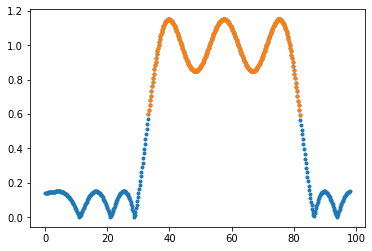

In [298]:
plt.plot(f, H, '.')
halfmaxH=0.5*np.max(H)
plt.plot(f[H>halfmaxH], H[H>halfmaxH], '.')



print(np.max(H),halfmaxH)
delta=0.01
selection=(H>(halfmaxH-delta))*(H<(halfmaxH+delta))
print(f[selection], H[selection])

Text(0, 0.5, 'Weight')

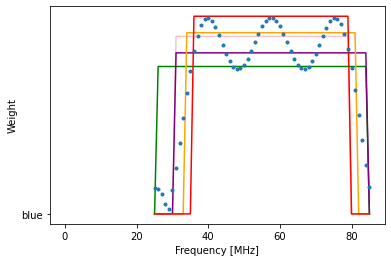

In [299]:
#Plot the various weighting functions I'm considering, all normalized
plt.plot(frequencies,tophat(30,80,frequencies),'pink')
plt.plot(frequencies,tophat(25,85,frequencies),'green')
plt.plot(frequencies,tophat(30,85,frequencies),'purple')
plt.plot(frequencies,tophat(33,82,frequencies),'orange')
plt.plot(frequencies,tophat(35,80,frequencies),'red')
plt.plot(frequencies, H_normed, '.','blue')

plt.xlabel('Frequency [MHz]')
plt.ylabel('Weight')

In [300]:
pol='NS'
alldriftcurves=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurves[i]=driftcurve[:,1]

In [301]:
alldriftcurves.shape[1]

144

Text(0, 0.5, 'Frequency Index')

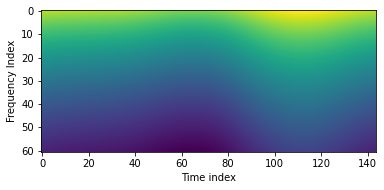

In [302]:
plt.imshow(np.log(alldriftcurves))
plt.xlabel("Time index")
plt.ylabel("Frequency Index")

In [303]:
def weighted_frequency_average(array,weights):
    average = np.zeros(array.shape[1])
    for i in range(array.shape[1]):
        average[i] = np.sum(weights*array[:,i])
    return average

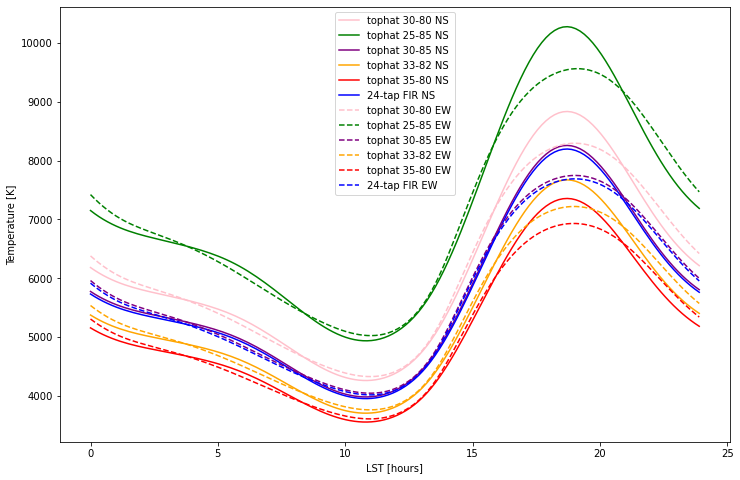

In [304]:
plt.figure(figsize=(12,8))

#NS
pol='NS'
alldriftcurves=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurves[i]=driftcurve[:,1]

tophat3080=weighted_frequency_average(alldriftcurves,tophat(30,80,frequencies))
tophat2585=weighted_frequency_average(alldriftcurves,tophat(25,85,frequencies))
tophat3085=weighted_frequency_average(alldriftcurves,tophat(30,85,frequencies))
tophat3382=weighted_frequency_average(alldriftcurves,tophat(33,82,frequencies))
tophat3580=weighted_frequency_average(alldriftcurves,tophat(35,80,frequencies))
weightH=weighted_frequency_average(alldriftcurves,H_normed)

plt.plot(driftcurve[:,0],tophat3080,'pink',label=str('tophat 30-80 '+pol))
plt.plot(driftcurve[:,0],tophat2585,'green',label=str('tophat 25-85 '+pol))
plt.plot(driftcurve[:,0],tophat3085,'purple',label=str('tophat 30-85 '+pol))
plt.plot(driftcurve[:,0],tophat3382,'orange',label=str('tophat 33-82 '+pol))
plt.plot(driftcurve[:,0],tophat3580,'red',label=str('tophat 35-80 '+pol))
plt.plot(driftcurve[:,0],weightH,'blue',label=str('24-tap FIR '+pol))

modelNS=weightH  #keep the one I want to use later

pol='EW'
alldriftcurves=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurves[i]=driftcurve[:,1]

tophat3080=weighted_frequency_average(alldriftcurves,tophat(30,80,frequencies))
tophat2585=weighted_frequency_average(alldriftcurves,tophat(25,85,frequencies))
tophat3085=weighted_frequency_average(alldriftcurves,tophat(30,85,frequencies))
tophat3382=weighted_frequency_average(alldriftcurves,tophat(33,82,frequencies))
tophat3580=weighted_frequency_average(alldriftcurves,tophat(35,80,frequencies))
weightH=weighted_frequency_average(alldriftcurves,H_normed)

plt.plot(driftcurve[:,0],tophat3080,'pink',label=str('tophat 30-80 '+pol),linestyle='dashed')
plt.plot(driftcurve[:,0],tophat2585,'green',label=str('tophat 25-85 '+pol),linestyle='dashed')
plt.plot(driftcurve[:,0],tophat3085,'purple',label=str('tophat 30-85 '+pol),linestyle='dashed')
plt.plot(driftcurve[:,0],tophat3382,'orange',label=str('tophat 33-82 '+pol),linestyle='dashed')
plt.plot(driftcurve[:,0],tophat3580,'red',label=str('tophat 35-80 '+pol),linestyle='dashed')
plt.plot(driftcurve[:,0],weightH,'blue',label=str('24-tap FIR '+pol),linestyle='dashed')

modelEW=weightH  #keep the one I want to use later

plt.xlabel('LST [hours]')
plt.ylabel('Temperature [K]')
plt.legend()

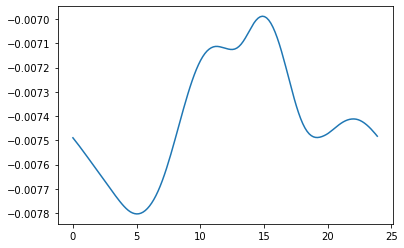

In [305]:
#plt.plot(driftcurve[:,0],((weightH-tophat3080)/weightH))
plt.plot(driftcurve[:,0],((weightH-tophat3085)/weightH))

In [306]:
pol='NS'
alldriftcurves=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurves[i]=driftcurve[:,1]

Conclusion:  The bandpass matters especially at low frequencies.  For now I'll use the FIR.  The 30-85 tophat gives a drift scan plot that is more similar to the one corresponding to the 24-tap FIR, which surprised me because I expected the 33-82 tophat to be more similar, since that matches the 3dB points of the FIR.

Things to think about:
    How can I get a better frequency response?
    Did I do the normalization on the weights correctly, or did that lose an overall scale factor?  I was surprised that the 35 to 85 tophat has a driftscan curve that peaks above the one for the 30-85 drift scan.

# Plot Noise RMS Over time
I am going to do this for events that pass the impulsiveness test.

This will involve: 1.Loading the events' summary stats and extracting the RMS (did I save this per-antenna?  I may have to re-run the summary code.) 2.Converting timestamps to sidereal time in decimal hours.  3. Show these results for different individual antennas.

Something to consider later is are these really dominated by Galactic noise?  There could be other RFI, and there is certainly a noise contribution from the amplifier (which I think is much less than the sky).  

Some ways to check how much RFI is contributing to the power are:

Plot spectra of these time series.

Check whether there is any systematic offset between the events whose timeseries I have looked at by eye and the average RMS at a similar time of night.



In [307]:
dataproductsdir='/lustre/kplant/2024October23-dataproducts/'
datadir='/lustre/kplant/2024October23/'
config=dataproductsdir+'config.yml'


with open(config, 'r') as file:
    configuration=yaml.safe_load(file)
#array_map_filename=configuration['array_map_filename'] 
array_map_filename='/home/kplant/lwa-cosmic-rays/array-map-5-22-2023.csv'
h=np.asarray(configuration['filter'])

lwa_df = reading.read_antpos()
namedict=build_mapping_dictionary(lwa_df)

array_map=pd.read_csv(array_map_filename)
xdict={}
ydict={}
zdict={}
for i,n in enumerate(array_map['antname']):
    xdict[n]=array_map['x'][i]
    ydict[n]=array_map['y'][i]
    zdict[n]=array_map['elevation'][i]
arraymapdictionaries=[xdict,ydict,zdict]

fs= 196 #MHz

In [308]:
#load the summary arrays for the events that passed the impulsive cut
filelist=[fname for fname in os.listdir(dataproductsdir) if (fname[:2]=='fi' and fname[-3:]=='npy')]
print(len(filelist))

arrays_to_merge=[]
for i in range(len(filelist)):
    #get the file name of the summary file and of the data file
    summaryfname=filelist[i]
    datafname=summaryfname[:-12]
    #load the summary array
    arr=np.load(dataproductsdir+summaryfname)
    #add this array to the list of arrays to merge
    arrays_to_merge.append(arr)
    
#merge all the arrays
impulsivesummary=np.concatenate(arrays_to_merge)

20


In [309]:
#This takes a while to run for thousands of events
#Enter location of OVRO-LWA, to use for LST calculation
location = astropy.coordinates.EarthLocation.from_geodetic(lon=-118.2951*u.deg, lat=37.2317*u.deg, height=0*u.m)

#initialize the dictionaries to hold the results
noiseA={}
noiseB={}

#Calculate indices for a selection of events, so that this uses events from a range of LST but doesn't run on the whole dataset (for runtime reasons)
number_impulsive_events=len(impulsivesummary)
number_events_to_use=2000
if number_events_to_use>=number_impulsive_events:
    indices=range(len(number_impulsive_events))
if number_events_to_use<number_impulsive_events:
    indices=np.linspace(0,number_impulsive_events-1,number_events_to_use,dtype=int)

#loop over the selection of events
for i in indices:
    datafname=impulsivesummary['datafname'][i]
    #get the timestamp and convert it to LST
    timestamp=impulsivesummary['timestamp'][i]
    unixtime=timestamp/(fs*1e6)
    timeobject = astropy.time.Time(unixtime, format='unix', location=location)
    lst = timeobject.sidereal_time('apparent').hour
    
    #load the data, calculate the per-antenna summary statistics, and flag antennas
    datafile=datadir+datafname
    index_in_file=impulsivesummary['index_in_file'][i]
    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
    event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
    event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,
    configuration['known_bad_antennas'])[0]
    
    #Loop over the individual antennas
    for a in range(len(event_summary_flagged)):
        antname=event_summary_flagged[a]['antname']
        pol=event_summary_flagged[a]['pol']
        rms=(event_summary_flagged[a]['mean_power'])**0.5
        
        #check which polarization's dictionary this should one belongs to
        if pol=='A':
            dictionary=noiseA
        elif pol=='B':
            dictionary=noiseB
        else:
            print('Could not parse polarization ',pol,pol=='A',pol=='B')
            break
        
        #check if the antenna already has an entry. 
        #If this is the first event for which the antenna was not flagged, make and entry.
        if antname not in dictionary.keys():
            newentry={}
            newentry['lst']=[]
            newentry['rms']=[]
            dictionary[antname]=newentry
        
        #Add the lst and the rms to the appropriate entry in the appropriate dictionary.
        #lst and rms are stored as lists that get appended to, instead of pre-allocated arrays, not every antenna will be present in the flagged summary array for every event
        dictionary[antname]['lst'].append(lst)
        dictionary[antname]['rms'].append(rms)
    
#convert to arrays instead of lists
for k in noiseA.keys():
    noiseA[k]['rms']=np.asarray(noiseA[k]['rms'])
    noiseA[k]['lst']=np.asarray(noiseA[k]['lst'])
    
for k in noiseB.keys():
    noiseB[k]['rms']=np.asarray(noiseB[k]['rms'])
    noiseB[k]['lst']=np.asarray(noiseB[k]['lst'])

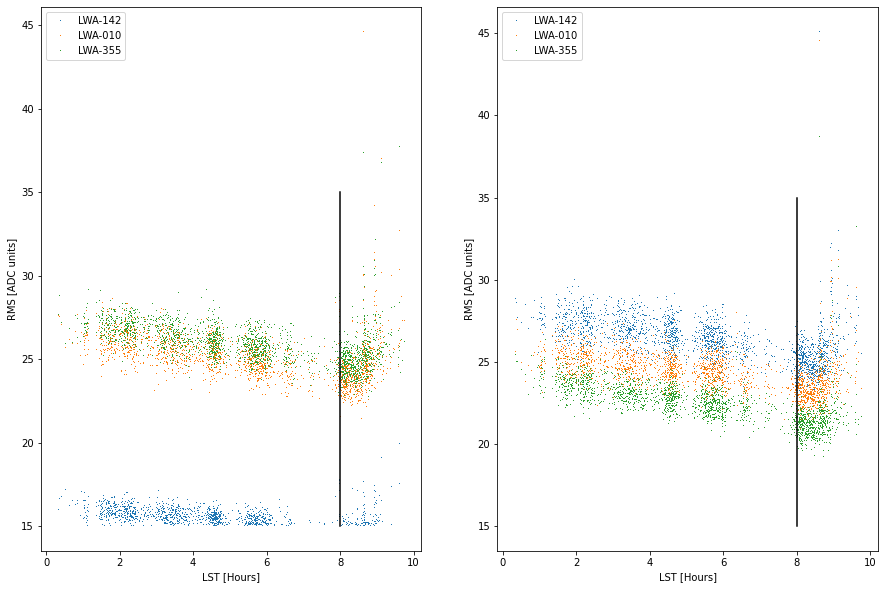

In [324]:
plt.figure(figsize=(15,10))
plt.subplot(121)
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    plt.plot(noiseA[n]['lst'],noiseA[n]['rms'],',',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.plot([8,8],[15,35],'k')


plt.subplot(122)
for n in names:
    plt.plot(noiseB[n]['lst'],noiseB[n]['rms'],',',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.plot([8,8],[15,35],'k')

plt.show()

# Compare RMS to Model
First I find a rough scaling in order plot these on same axes.

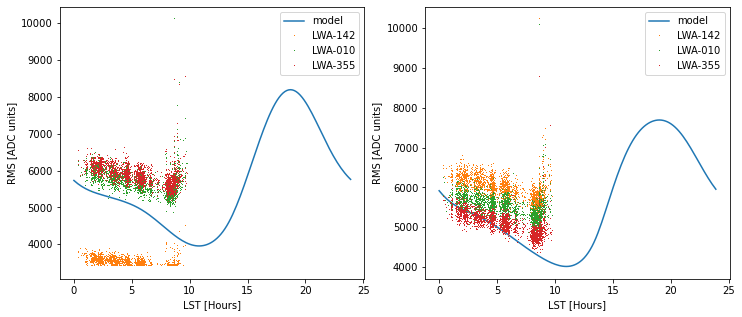

In [317]:
typicalrms=25
modelmean=(np.mean(modelEW)+np.mean(modelNS))/2
roughscale=modelmean/typicalrms

plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],modelNS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    plt.plot(noiseA[n]['lst'],roughscale*noiseA[n]['rms'],',',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],modelEW,label=str('model'))
for n in names:
    plt.plot(noiseB[n]['lst'],roughscale*noiseB[n]['rms'],',',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.show()



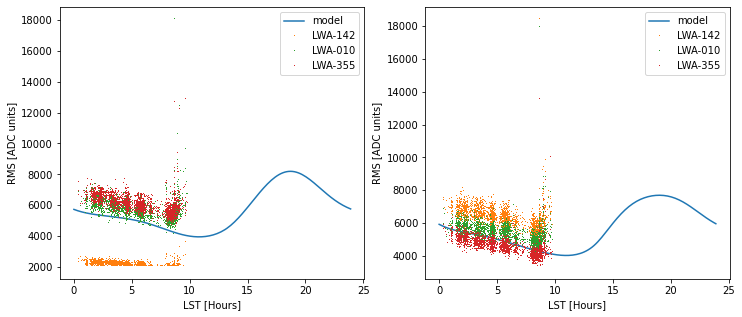

In [334]:
typicalrms=25
modelmean=(np.mean(modelEW)+np.mean(modelNS))/2
roughscale2=modelmean/(typicalrms**2)

plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],modelNS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    plt.plot(noiseA[n]['lst'],roughscale2*((noiseA[n]['rms'])**2),',',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],modelEW,label=str('model'))
for n in names:
    plt.plot(noiseB[n]['lst'],roughscale2*((noiseB[n]['rms'])**2),',',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS [ADC units]')
plt.legend()

plt.show()


In [419]:
#do some binning by LST, and stop before the obvious RFI in the morning
#note that the arrays are not ordered chronologically because of the way files were processed in parallel


def bin_rms_by_lst(lst,rms,startlst,stoplst,nbins):
    lstbins=np.linspace(startlst,stoplst,nbins+1)
    lst_binned=np.zeros(nbins)
    rms_binned=np.zeros(nbins)
    sigma_rms_binned=np.zeros(nbins)
    rms_bin_median=np.zeros(nbins)
    goodbin=np.zeros(nbins,dtype=bool)


    for i in range(nbins):
        lowerbound=lstbins[i]
        upperbound=lstbins[i+1]
        lst_binned[i]=(lowerbound+upperbound)/2
        indicesforbin=(lst>lowerbound)*(lst<upperbound)
        if np.sum(indicesforbin)>3:
            rmsforbin=rms[indicesforbin]
            rms_binned[i]=np.mean(rmsforbin)
            sigma_rms_binned[i]=np.std(rmsforbin)/(len(rmsforbin)**0.5)
            rms_bin_median[i] = np.median(rmsforbin)
            goodbin[i]=True
            
        else: 
            rms_binned[i]=-1
            sigma_rms_binned[i]=-1
            rms_bin_median[i]=-1
            goodbin[i]=False
            
    lst_binned=lst_binned[goodbin]
    rms_binned=rms_binned[goodbin]
    sigma_rms_binned=sigma_rms_binned[goodbin]
    rms_bin_median=rms_bin_median[goodbin]
    return lst_binned,rms_binned,sigma_rms_binned,rms_bin_median

In [420]:
lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_median=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,2)


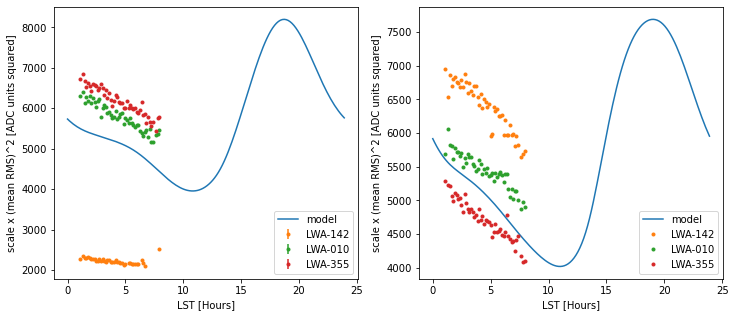

In [426]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],modelNS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,50)
    plt.errorbar(lst_binnedA,roughscale2*(rms_binnedA)**2,roughscale2*(sigma_rms_binnedA)**2,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('scale x (mean RMS)^2 [ADC units squared]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],modelEW,label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,50)
    plt.plot(lst_binnedB,roughscale2*((rms_binnedB)**2),'.',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('scale x (mean RMS)^2 [ADC units squared]')
plt.legend()

plt.show()

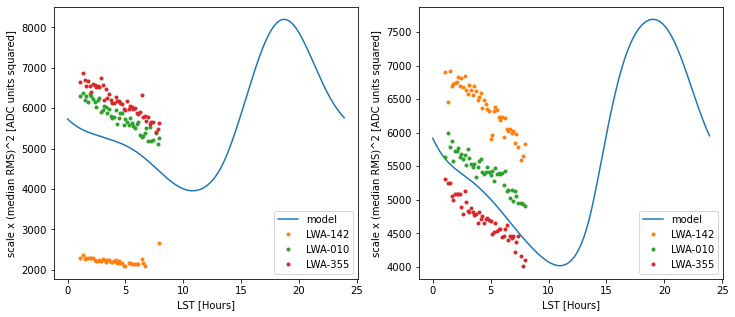

In [427]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],modelNS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,50)
    plt.plot(lst_binnedA,roughscale2*(rms_bin_medianA)**2,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('scale x (median RMS)^2 [ADC units squared]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],modelEW,label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,50)
    plt.plot(lst_binnedB,roughscale2*(rms_bin_medianB)**2,marker='.',linestyle='none',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('scale x (median RMS)^2 [ADC units squared]')
plt.legend()

plt.show()

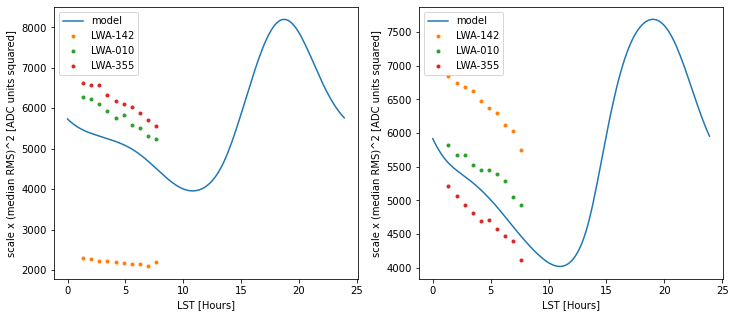

In [428]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],modelNS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,10)
    plt.plot(lst_binnedA,roughscale2*(rms_bin_medianA)**2,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('scale x (median RMS)^2 [ADC units squared]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],modelEW,label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,10)
    plt.plot(lst_binnedB,roughscale2*(rms_bin_medianB)**2,marker='.',linestyle='none',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('scale x (median RMS)^2 [ADC units squared]')
plt.legend()

plt.show()

Idea for how to check the affect of RFI in this:   Do the proceedure for the dataset of noise read out regularly over 24 hours.  Even though I don't have this for the day of a cosmic ray detection, I can see how much difference it makes to the goodness of fit and I can also check how much difference it makes having this LST range vs the full LST range.

# Convert the model from temperature to RMS electric field
$$E_{RMS} = 8.52\times 10^{-4}\mu V/m \sqrt{\frac{\Delta \nu}{\rm{MHz}} \sum_i B_i (\frac{\nu_i}{{\rm{MHz}}})^2\frac{T_i}{K}}$$

In [446]:


def E_rms_total(temperature,frequency,bandpass,deltanu):
    #temperature is a 2D array of temperatures. The first index runs over sidereal time and the second index runs over frequency
    #frequency is a 1D array of linearly equally spaced frequencies in MHz corresponding to the frequency axis of the temperature array
    #bandpass is a 1D array of the normalized bandpass weights corresponding to the frequency axis of the temperature array
    #bandpass is normalized such that sum(bandpass)=1
    #deltanu is the size of the frequency step between adjacent frequency bins, in MHz

    total = np.zeros(temperature.shape[1]) #allocate array for output
    prefactor=8.52e-4 #microvolts per meter
    for i in range(temperature.shape[1]):
        #print(bandpass.shape,temperature[:,i].shape,frequency.shape)
        total[i] = prefactor*np.sqrt(deltanu*np.sum(bandpass*temperature[:,i]*(frequency**2)))
    return total

In [447]:
deltanu=1 #MHz

pol='EW'
alldriftcurvesEW=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurvesEW[i]=driftcurve[:,1]
    
pol='NS'
alldriftcurvesNS=np.zeros((len(frequencies),144))
for i,f in enumerate(frequencies):
    driftcurve = np.loadtxt('/home/kplant/model_driftcurves/driftcurve_ovro_'+pol+'_'+str(f)+'.00.txt')
    alldriftcurvesNS[i]=driftcurve[:,1]

totalE_NS=E_rms_total(alldriftcurvesNS,np.asarray(frequencies),H_normed,deltanu)
totalE_EW=E_rms_total(alldriftcurvesEW,frequencies,H_normed,deltanu)

In [448]:
totalE_NS

array([3.19786785, 3.1847697 , 3.17272221, 3.16163834, 3.15144973,
       3.14209505, 3.1335064 , 3.12562771, 3.11839564, 3.11174205,
       3.10559309, 3.09987107, 3.09449568, 3.08939132, 3.08448938,
       3.07972369, 3.07504021, 3.07039404, 3.06575424, 3.06109726,
       3.05639712, 3.05162673, 3.04676057, 3.04176794, 3.0366215 ,
       3.03130044, 3.02577888, 3.02002505, 3.01401016, 3.00769573,
       3.00101859, 2.99392509, 2.98636676, 2.97830581, 2.9697116 ,
       2.96055961, 2.95084073, 2.94055847, 2.92971942, 2.91834927,
       2.9064937 , 2.89419974, 2.88151555, 2.86849278, 2.85518631,
       2.84165806, 2.82797841, 2.81422632, 2.80048605, 2.78684653,
       2.77339734, 2.76023239, 2.74745052, 2.73515491, 2.72345109,
       2.71243183, 2.7021911 , 2.69280479, 2.6843531 , 2.67690036,
       2.67052769, 2.66528645, 2.66124252, 2.65844977, 2.65696702,
       2.65685671, 2.65816956, 2.66095029, 2.66526435, 2.67118959,
       2.67878152, 2.68809983, 2.69921107, 2.7121962 , 2.72714

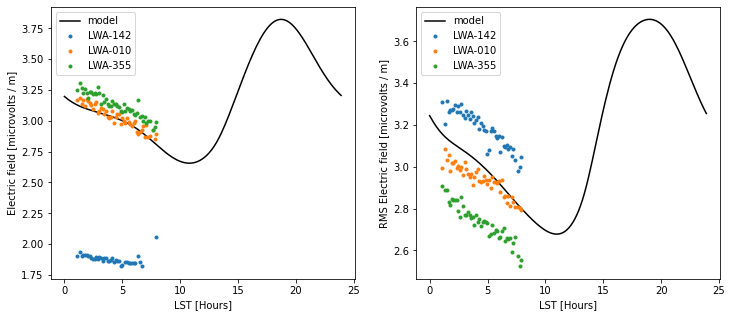

In [626]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],totalE_NS,'k',label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
roughscale3=3/25
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,50)
    plt.plot(lst_binnedA,roughscale3*rms_bin_medianA,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()

plt.subplot(122)
plt.plot(driftcurve[:,0],totalE_EW,'k',label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,50)
    plt.plot(lst_binnedB,roughscale3*rms_bin_medianB,marker='.',linestyle='none',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS Electric field [microvolts / m]')
plt.legend()

plt.show()

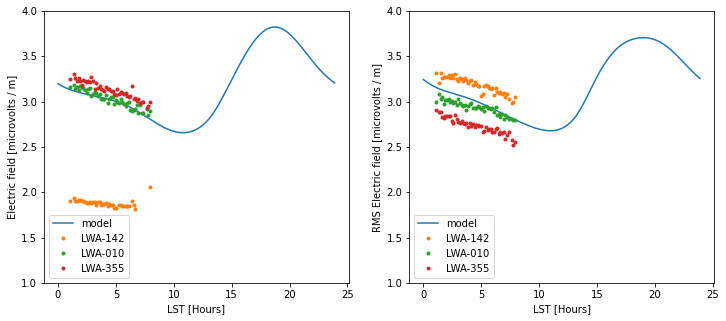

In [457]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],totalE_NS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
roughscale3=3/25
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,50)
    plt.plot(lst_binnedA,roughscale3*rms_bin_medianA,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(1,4)

plt.subplot(122)
plt.plot(driftcurve[:,0],totalE_EW,label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,50)
    plt.plot(lst_binnedB,roughscale3*rms_bin_medianB,marker='.',linestyle='none',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS Electric field [microvolts / m]')
plt.legend()
plt.ylim(1,4)
plt.show()

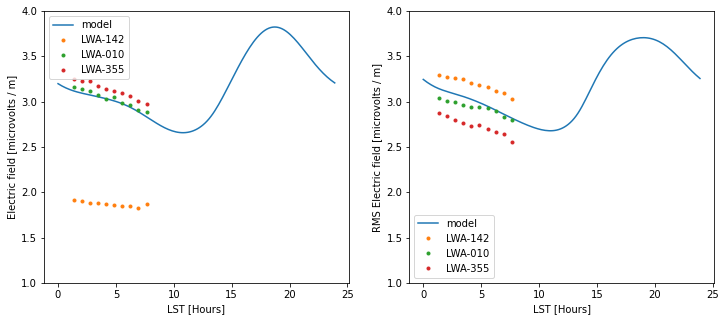

In [521]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(driftcurve[:,0],totalE_NS,label=str('model'))
names=['LWA-142','LWA-010','LWA-355']
roughscale3=3/25
for n in names:
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,10)
    plt.plot(lst_binnedA,roughscale3*rms_bin_medianA,marker='.',linestyle='none',label=n)


plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(1,4)

plt.subplot(122)
plt.plot(driftcurve[:,0],totalE_EW,label=str('model'))
for n in names:
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,10)
    plt.plot(lst_binnedB,roughscale3*rms_bin_medianB,marker='.',linestyle='none',label=n)
plt.xlabel('LST [Hours]')
plt.ylabel('RMS Electric field [microvolts / m]')
plt.legend()
plt.ylim(1,4)
plt.show()


# Gain solution

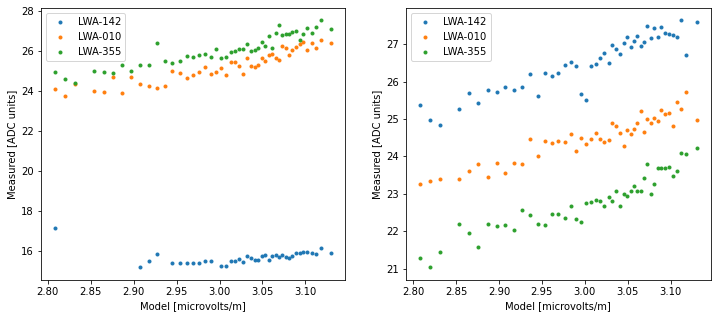

In [499]:
plt.figure(figsize=(12,5))
plt.subplot(121)

for n in names:
    #bin the rms data by lst
    lst_binnedA,rms_binnedA,sigma_rms_binnedA,rms_bin_medianA=bin_rms_by_lst(noiseA[n]['lst'],noiseA[n]['rms'],1,8,50)
    #interpolate the model to the same lsts
    model=np.interp(lst_binnedA,driftcurve[:,0],totalE_NS)
    plt.plot(model,rms_bin_medianA,'.',label=n)
    
plt.ylabel('Measured [ADC units]')
plt.xlabel('Model [microvolts/m]')
plt.legend()
plt.subplot(122)
for n in names:
    #bin the rms data by lst
    lst_binnedB,rms_binnedB,sigma_rms_binnedB,rms_bin_medianB=bin_rms_by_lst(noiseB[n]['lst'],noiseB[n]['rms'],1,8,50)
    #interpolate the model to the same lsts
    y=np.interp(lst_binnedB,driftcurve[:,0],totalE_EW)
    plt.plot(model,rms_bin_medianB,'.',label=n)
plt.ylabel('Measured [ADC units]')
plt.xlabel('Model [microvolts/m]')
plt.legend()

plt.show()

In [620]:
def gainsolve(model,data,sigma):
    #finds the gain that minimizes chi squared
    #data is the measured rms
    #model is the rms electric field derived from a sky model
    #sigma is the uncertainties on the measured rms
    #data, model, and sigma are 1D arrays of same length
    
    weights=sigma**-2
    g=np.sum(model*data*weights)/np.sum(model*model*weights)
    sigg=np.sqrt(np.sum(model*model*weights))
    
    #report reduced chi squared value
    chisq=np.sum(((data-(model*g))**2)*weights)/len(data)
    
    #I want gain such that gain*data~model, but since the data has the relevant statistical uncertainty the least squares has to do it the other way around, so I return the inverse
    G=1/g
    sigG=1/sigg
    return  G,sigg,chisq  
    


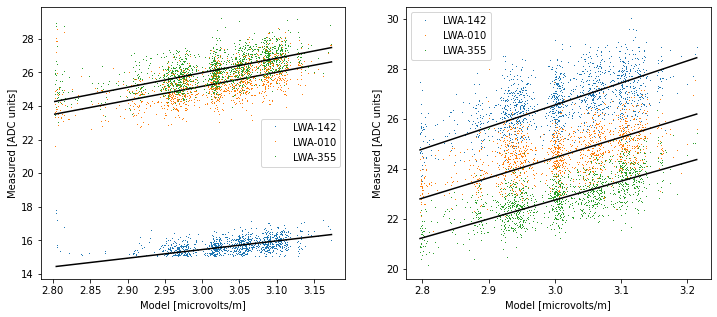

In [624]:
plt.figure(figsize=(12,5))
plt.subplot(121)

for n in names:
    fulldata=noiseA[n]
    fullmodel=totalE_NS
    fullmodellsts=driftcurve[:,0]
    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    
    #plot the results
    plt.plot(model,data,',',label=n)
    plt.plot([np.min(model),np.max(model)],[(1/G)*np.min(model),(1/G)*np.max(model)],'k')

    
plt.ylabel('Measured [ADC units]')
plt.xlabel('Model [microvolts/m]')
plt.legend()

plt.subplot(122)
for n in names:
    fulldata=noiseB[n]
    fullmodel=totalE_EW
    fullmodellsts=driftcurve[:,0]
    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    
    #plot the results
    plt.plot(model,data,',',label=n)
    plt.plot([np.min(model),np.max(model)],[(1/G)*np.min(model),(1/G)*np.max(model)],'k')
    
plt.ylabel('Measured [ADC units]')
plt.xlabel('Model [microvolts/m]')
plt.legend()

plt.show()

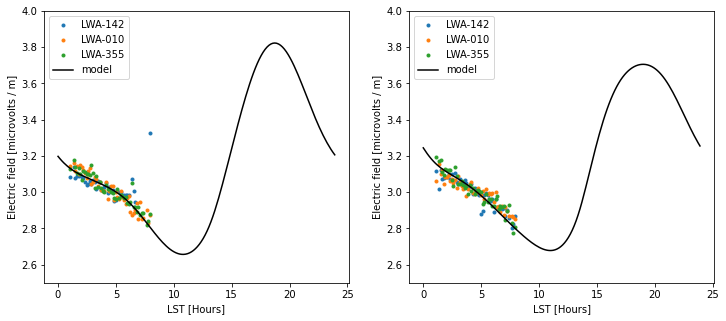

In [622]:
plt.figure(figsize=(12,5))
plt.subplot(121)
#NS polarization
fullmodel=totalE_NS
allantennas=noiseA
fullmodellsts=driftcurve[:,0]
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    fulldata=allantennas[n]

    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    lst_binned,rms_binned,sigma_rms_binned,rms_bin_median=bin_rms_by_lst(fulldata['lst'],fulldata['rms'],1,8,50)
    plt.plot(lst_binned,G*rms_bin_median,marker='.',linestyle='none',label=n)
plt.plot(fullmodellsts,fullmodel,'k',label=str('model'))

plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(2.5,4)

plt.subplot(122)
#EW polarization
fullmodel=totalE_EW
allantennas=noiseB
fullmodellsts=driftcurve[:,0]
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    fulldata=allantennas[n]

    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    lst_binned,rms_binned,sigma_rms_binned,rms_bin_median=bin_rms_by_lst(fulldata['lst'],fulldata['rms'],1,8,50)
    plt.plot(lst_binned,G*rms_bin_median,marker='.',linestyle='none',label=n)
plt.plot(fullmodellsts,fullmodel,'k',label=str('model'))

plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(2.5,4)
plt.show()

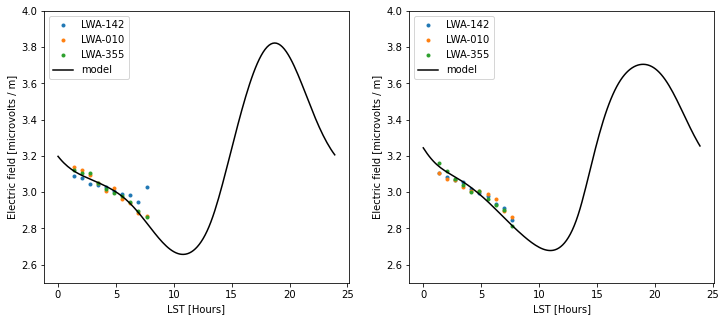

In [542]:
plt.figure(figsize=(12,5))
plt.subplot(121)
#NS polarization
fullmodel=totalE_NS
allantennas=noiseA
fullmodellsts=driftcurve[:,0]
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    fulldata=allantennas[n]

    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    lst_binned,rms_binned,sigma_rms_binned,rms_bin_median=bin_rms_by_lst(fulldata['lst'],fulldata['rms'],1,8,10)
    plt.plot(lst_binned,G*rms_bin_median,marker='.',linestyle='none',label=n)
plt.plot(fullmodellsts,fullmodel,'k',label=str('model'))

plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(2.5,4)

plt.subplot(122)
#EW polarization
fullmodel=totalE_EW
allantennas=noiseB
fullmodellsts=driftcurve[:,0]
names=['LWA-142','LWA-010','LWA-355']
for n in names:
    fulldata=allantennas[n]

    #limit the data to the night time and define the uncertainty on the rms
    lst_range=fulldata['lst']<8
    data=fulldata['rms'][lst_range]
    sigma=data/(2000**0.5)  #statistical uncertainty on rms is rms/sqrt(number of samples)
    
    #interpolate the model to the same lsts
    model=np.interp(fulldata['lst'][lst_range],fullmodellsts,fullmodel)
    
    G,sigG,chisq=gainsolve(model,data,sigma)
    lst_binned,rms_binned,sigma_rms_binned,rms_bin_median=bin_rms_by_lst(fulldata['lst'],fulldata['rms'],1,8,10)
    plt.plot(lst_binned,G*rms_bin_median,marker='.',linestyle='none',label=n)
plt.plot(fullmodellsts,fullmodel,'k',label=str('model'))

plt.xlabel('LST [Hours]')
plt.ylabel('Electric field [microvolts / m]')
plt.legend()
plt.ylim(2.5,4)
plt.show()

## Can I use kurtosis to select events with less RFI?

In [543]:
impulsivesummary.dtype.fields

mappingproxy({'index_in_file': (dtype('int32'), 0),
              'timestamp': (dtype('uint64'), 4),
              'n_good_antennas': (dtype('uint32'), 12),
              'n_saturated': (dtype('uint32'), 16),
              'n_kurtosis_bad': (dtype('uint32'), 20),
              'n_power_bad': (dtype('uint32'), 24),
              'power_ratioA': (dtype('float32'), 28),
              'power_ratioB': (dtype('float32'), 32),
              'max_core_vs_far_ratio': (dtype('float32'), 36),
              'sum_top_5_core_vs_far_ratio': (dtype('float32'), 40),
              'sum_top_10_core_vs_far_ratio': (dtype('float32'), 44),
              'meansnr_nearby': (dtype('float32'), 48),
              'meansnr_nearbyA': (dtype('float32'), 52),
              'meansnr_nearbyB': (dtype('float32'), 56),
              'meansnr': (dtype('float32'), 60),
              'meansnrA': (dtype('float32'), 64),
              'meansnrB': (dtype('float32'), 68),
              'datafname': (dtype('<U100'), 72),
      

In [555]:
#I'm re-running the code that loads event data in order to save per-antenna kurtosis as well as rms
#This takes a while to run for thousands of events
#Enter location of OVRO-LWA, to use for LST calculation
location = astropy.coordinates.EarthLocation.from_geodetic(lon=-118.2951*u.deg, lat=37.2317*u.deg, height=0*u.m)

#initialize the dictionaries to hold the results
noiseA2={}
noiseB2={}


#Calculate indices for a selection of events, so that this uses events from a range of LST but doesn't run on the whole dataset (for runtime reasons)
number_impulsive_events=len(impulsivesummary)
number_events_to_use=500
if number_events_to_use>=number_impulsive_events:
    indices=range(len(number_impulsive_events))
if number_events_to_use<number_impulsive_events:
    indices=np.linspace(0,number_impulsive_events-1,number_events_to_use,dtype=int)

#loop over the selection of events
for i in indices:
    datafname=impulsivesummary['datafname'][i]
    #get the timestamp and convert it to LST
    timestamp=impulsivesummary['timestamp'][i]
    unixtime=timestamp/(fs*1e6)
    timeobject = astropy.time.Time(unixtime, format='unix', location=location)
    lst = timeobject.sidereal_time('apparent').hour
    
    #load the data, calculate the per-antenna summary statistics, and flag antennas
    datafile=datadir+datafname
    index_in_file=impulsivesummary['index_in_file'][i]
    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
    event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
    event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,
    configuration['known_bad_antennas'])[0]
    
    #Loop over the individual antennas
    for a in range(len(event_summary_flagged)):
        antname=event_summary_flagged[a]['antname']
        pol=event_summary_flagged[a]['pol']
        rms=(event_summary_flagged[a]['mean_power'])**0.5
        kurtosis=event_summary_flagged[a]['kurtosis']
        
        #check which polarization's dictionary this  one belongs to
        if pol=='A':
            dictionary=noiseA2
        elif pol=='B':
            dictionary=noiseB2
        else:
            print('Could not parse polarization ',pol,pol=='A',pol=='B')
            break
        
        #check if the antenna already has an entry. 
        #If this is the first event for which the antenna was not flagged, make and entry.
        if antname not in dictionary.keys():
            newentry={}
            newentry['lst']=[]
            newentry['rms']=[]
            newentry['kurtosis']=[]
            dictionary[antname]=newentry
        
        #Add the lst and the rms to the appropriate entry in the appropriate dictionary.
        #lst and rms are stored as lists that get appended to, instead of pre-allocated arrays, not every antenna will be present in the flagged summary array for every event
        dictionary[antname]['lst'].append(lst)
        dictionary[antname]['rms'].append(rms)
        dictionary[antname]['kurtosis'].append(kurtosis)
        
#convert to arrays instead of lists
for k in noiseA2.keys():
    noiseA2[k]['rms']=np.asarray(noiseA2[k]['rms'])
    noiseA2[k]['lst']=np.asarray(noiseA2[k]['lst'])
    noiseA2[k]['kurtosis']=np.asarray(noiseA2[k]['kurtosis'])

    
for k in noiseB2.keys():
    noiseB2[k]['rms']=np.asarray(noiseB2[k]['rms'])
    noiseB2[k]['lst']=np.asarray(noiseB2[k]['lst'])
    noiseB2[k]['kurtosis']=np.asarray(noiseB2[k]['kurtosis'])


### Examine the distribution of kurtosis


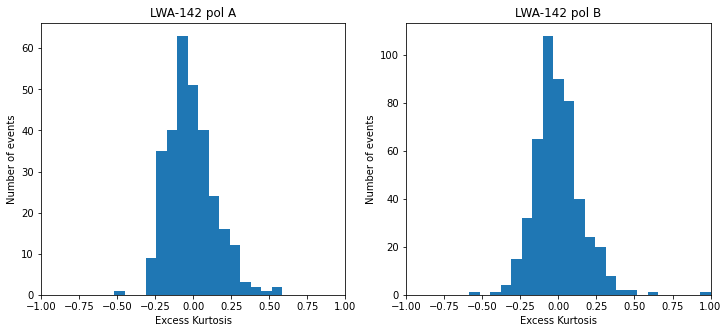

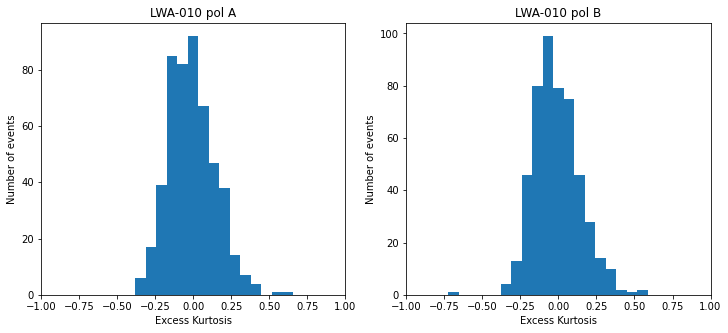

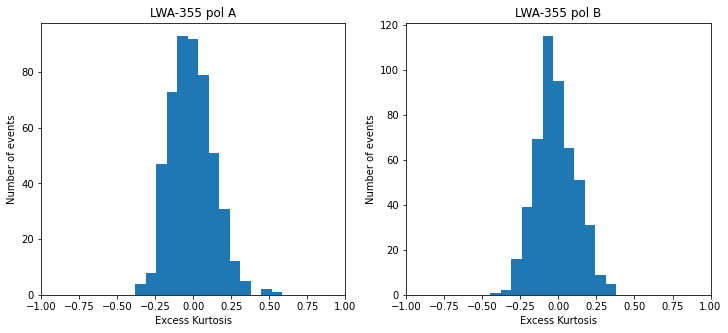

In [649]:
names=['LWA-142','LWA-010','LWA-355']
for i,n in enumerate(names):
    plt.figure(i+1,figsize=(12,5))
    plt.subplot(121)
    #plt.hist(noiseA2[n]['kurtosis'],label=n)
    plt.hist(noiseA2[n]['kurtosis'],bins=np.linspace(-1,1,30),label=n)
    plt.ylabel('Number of events')
    plt.xlabel('Excess Kurtosis')
    plt.title(n+' pol A')
    plt.xlim(-1,1)
    plt.subplot(122)
    #plt.hist(noiseB2[n]['kurtosis'],label=n)
    plt.hist(noiseB2[n]['kurtosis'],bins=np.linspace(-1,1,30),label=n)
    plt.ylabel('Number of events')
    plt.xlabel('Excess Kurtosis')
    plt.title(n+' pol B')
    plt.xlim(-1,1)

(-1.0, 1.0)

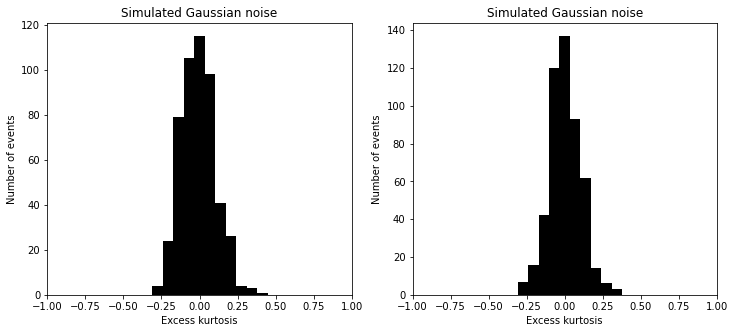

In [650]:
plt.figure(figsize=(12,5))
plt.subplot(121)

kurtosis=[]
for i in range(500):
    kurtosis.append(st.kurtosis(np.random.randn(2000)))
plt.hist(kurtosis,bins=np.linspace(-1,1,30),color='k')

plt.title('Simulated Gaussian noise')
plt.xlabel('Excess kurtosis')
plt.ylabel('Number of events')
plt.xlim(-1,1)

plt.subplot(122)  #do the simulation a second time to get an idea of the variation
kurtosis=[]
for i in range(500):
    kurtosis.append(st.kurtosis(np.random.randn(2000)))
plt.hist(kurtosis,bins=np.linspace(-1,1,30),color='k')

plt.title('Simulated Gaussian noise')
plt.xlabel('Excess kurtosis')
plt.ylabel('Number of events')
plt.xlim(-1,1)

In [633]:
for i,n in enumerate(names):
    print(len(noiseA2[n]['kurtosis']))

299
500
498


At a glance, this range of kurtosis is typical for samples drawn from a normal distribution (haven't done a statistical test to quantify that statement).   Below, kurtosis doesn't dramatically increase for the part of the time series where the rms increases, although there are a few clear outliers in this time range.  

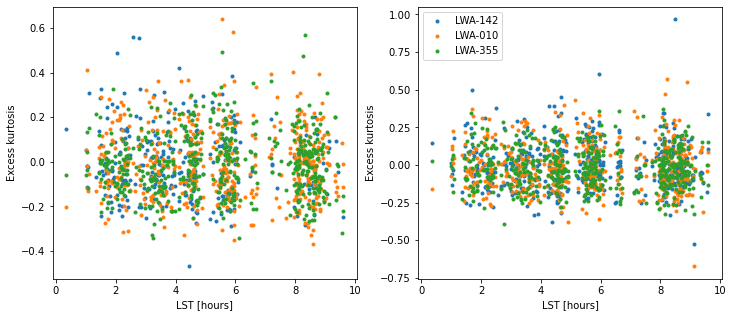

In [579]:
plt.figure(figsize=(12,5))
plt.subplot(121)
for i,n in enumerate(names):
    plt.plot(noiseA2[n]['lst'],noiseA2[n]['kurtosis'],'.',label=n)

plt.xlabel('LST [hours]')
plt.ylabel('Excess kurtosis')

plt.subplot(122)
for i,n in enumerate(names):
    plt.plot(noiseB2[n]['lst'],noiseB2[n]['kurtosis'],'.',label=n)    

plt.xlabel('LST [hours]')
plt.ylabel('Excess kurtosis')
plt.legend()

7.9708011397962535
9.6069541017756
9.124762107668964
9.124762107668964
9.124762107668964
9.124762107668964


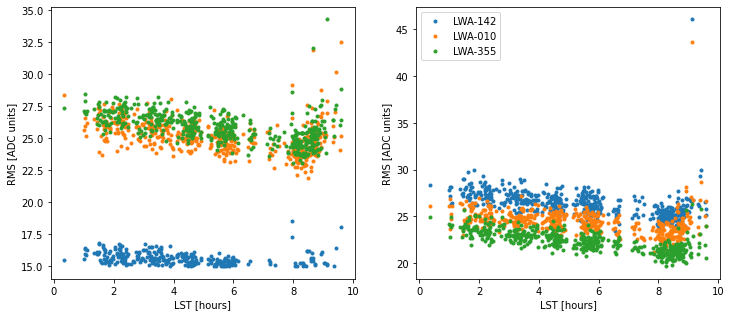

In [615]:
plt.figure(figsize=(12,5))
plt.subplot(121)
for i,n in enumerate(names):
    plt.plot(noiseA2[n]['lst'],noiseA2[n]['rms'],'.',label=n)
    print(noiseA2[n]['lst'][np.argmax(noiseA2[n]['rms'])])

plt.xlabel('LST [hours]')
plt.ylabel('RMS [ADC units]')

plt.subplot(122)
for i,n in enumerate(names):
    plt.plot(noiseB2[n]['lst'],noiseB2[n]['rms'],'.',label=n)    
    print(noiseB2[n]['lst'][np.argmax(noiseB2[n]['rms'])])
plt.xlabel('LST [hours]')
plt.ylabel('RMS [ADC units]')   
plt.legend()

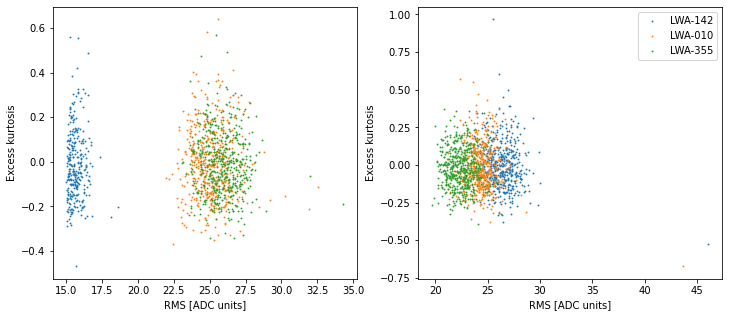

In [581]:
plt.figure(figsize=(12,5))
plt.subplot(121)
for i,n in enumerate(names):
    plt.scatter(noiseA2[n]['rms'],noiseA2[n]['kurtosis'],marker='.',s=3,label=n)

plt.ylabel('Excess kurtosis')
plt.xlabel('RMS [ADC units]')

plt.subplot(122)
for i,n in enumerate(names):
    plt.scatter(noiseB2[n]['rms'],noiseB2[n]['kurtosis'],marker='.',s=3,label=n)   

plt.ylabel('Excess kurtosis')
plt.xlabel('RMS [ADC units]')
plt.legend()
plt.show()

In [176]:
print(event_summary_flagged.dtype.fields)
print(event_summary_flagged[0])

mappingproxy({'antname': (dtype('<U10'), 0),
              'pol': (dtype('<U10'), 40),
              'x': (dtype('float32'), 80),
              'y': (dtype('float32'), 84),
              'z': (dtype('float32'), 88),
              'distance': (dtype('float32'), 92),
              'index_raw_peak': (dtype('uint32'), 96),
              'index_smooth_peak': (dtype('uint32'), 100),
              'index_hilbert_peak': (dtype('uint32'), 104),
              'raw_peak': (dtype('float32'), 108),
              'filtered_voltage_peak': (dtype('float32'), 112),
              'power_peak': (dtype('float32'), 116),
              'smooth_power_peak': (dtype('float32'), 120),
              'hilbert_peak': (dtype('float32'), 124),
              'mean_power': (dtype('float32'), 128),
              'mean_power_after': (dtype('float32'), 132),
              'powerratio': (dtype('float32'), 136),
              'kurtosis': (dtype('float32'), 140),
              'snr': (dtype('float32'), 144),
              '

In [613]:
impulsivesummary.dtype.fields

mappingproxy({'index_in_file': (dtype('int32'), 0),
              'timestamp': (dtype('uint64'), 4),
              'n_good_antennas': (dtype('uint32'), 12),
              'n_saturated': (dtype('uint32'), 16),
              'n_kurtosis_bad': (dtype('uint32'), 20),
              'n_power_bad': (dtype('uint32'), 24),
              'power_ratioA': (dtype('float32'), 28),
              'power_ratioB': (dtype('float32'), 32),
              'max_core_vs_far_ratio': (dtype('float32'), 36),
              'sum_top_5_core_vs_far_ratio': (dtype('float32'), 40),
              'sum_top_10_core_vs_far_ratio': (dtype('float32'), 44),
              'meansnr_nearby': (dtype('float32'), 48),
              'meansnr_nearbyA': (dtype('float32'), 52),
              'meansnr_nearbyB': (dtype('float32'), 56),
              'meansnr': (dtype('float32'), 60),
              'meansnrA': (dtype('float32'), 64),
              'meansnrB': (dtype('float32'), 68),
              'datafname': (dtype('<U100'), 72),
      

## Inspect timeseries and sample distributions

In [609]:
#here's an update to a function I'll put in cr_data_inspection_functions.py
def plot_select_antennas(event,antennas,Filter=False):
    #Event is a list of records (single-packet dictionaries) belonging to the same event
    #antennas is a list where each element in the list is a string with antenna name including polarization, e.g. 'LWA-353B'
    #If Filter is specified as a 1D array of coefficients, the timeseries will be convolved with that filter before plotting
    #If a requested antenna to plot is not in the list (which happens if that packet has been lost), the missing antenna is skipped
    #The requested antennas are plotted in the order they appear in event, not in the order of the input list
    for record in event:
        s=record['board_id']
        a=packet_ant_id_2_snap_input(record['antenna_id'])
        antname=mapping.snap2_to_antpol(s,a)
        if antname in antennas:
            timeseries=record['data']
            if type(Filter)==np.ndarray:
                timeseries=signal.convolve(timeseries,Filter,mode='valid')
            plt.figure(figsize=(20,5))
            plt.suptitle(antname + ' snap '+ str(s) + ' antenna ' + str(a))
            
            plt.subplot(131)
            plt.plot(timeseries)
            plt.xlabel('time sample')
            plt.ylabel('voltage [ADC units]')

            plt.subplot(132)
            plt.hist(timeseries)
            plt.xlabel('Voltage [ADC units]')
            plt.ylabel('Counts')

            plt.subplot(133)
            plt.xlabel('frequency channel')
            plt.ylabel('power')
            spec=np.fft.rfft(timeseries)
            plt.plot(np.log(np.square(np.abs(spec))))     
    return

/opt/devel/kplant/envs/analysis/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


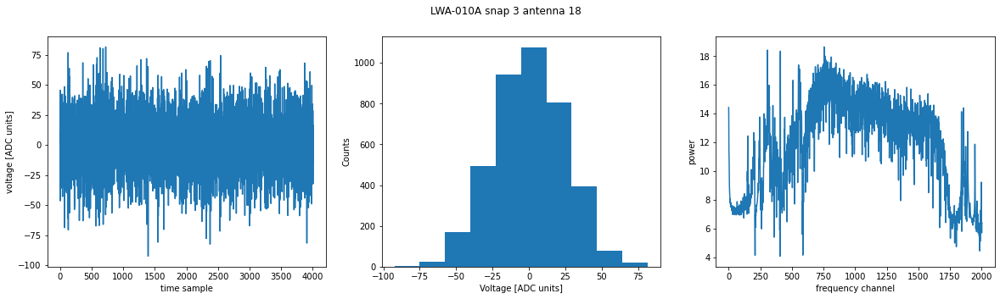

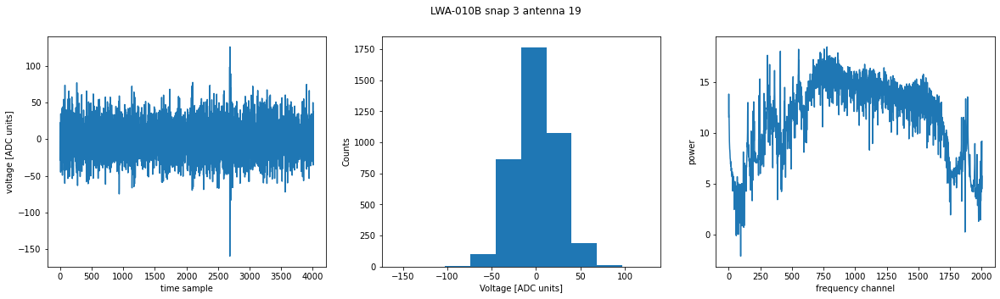

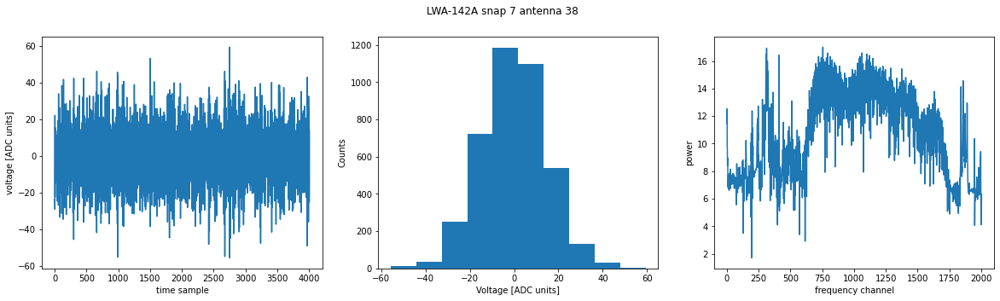

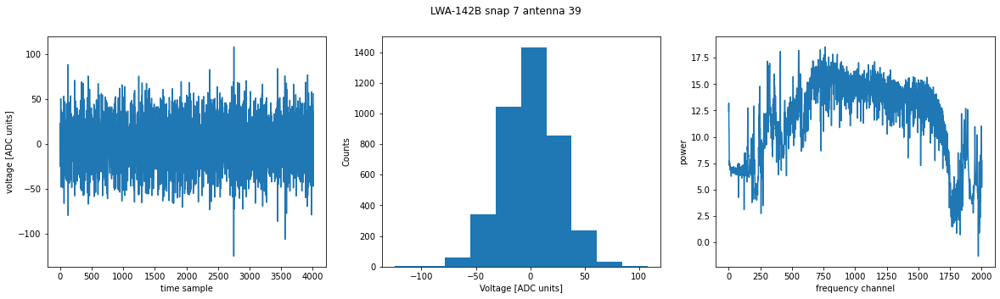

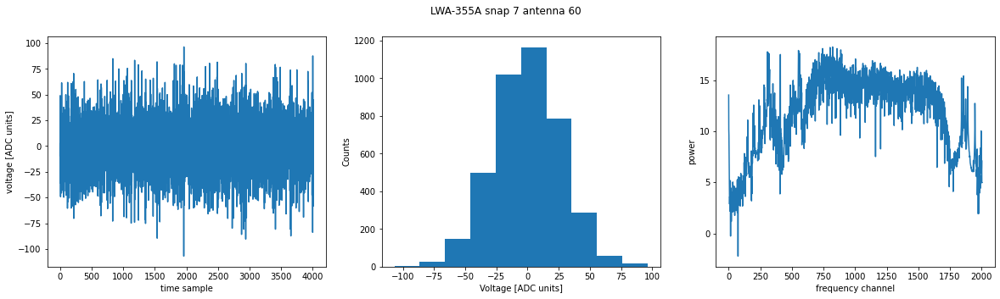

...

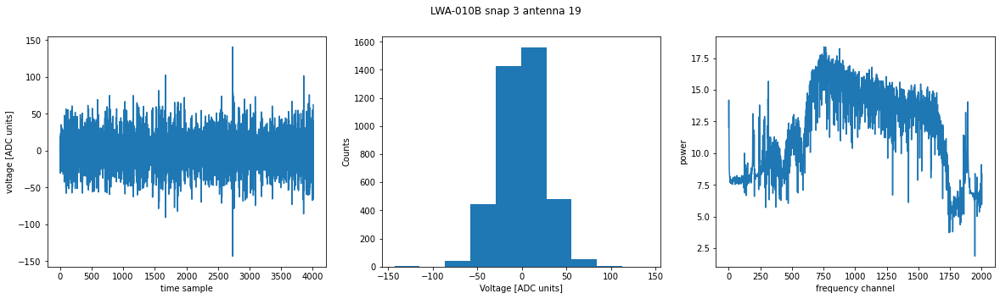

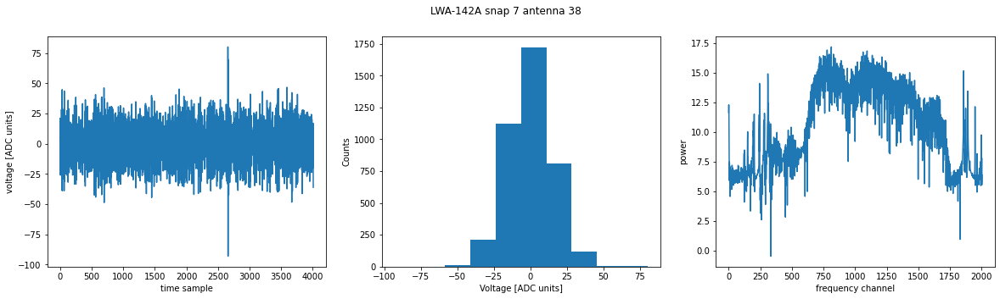

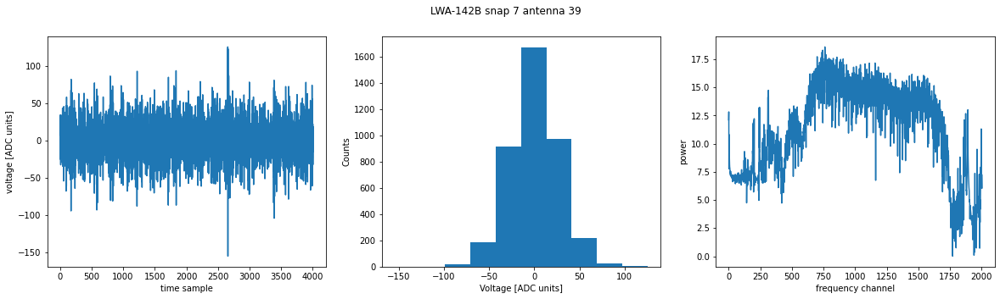

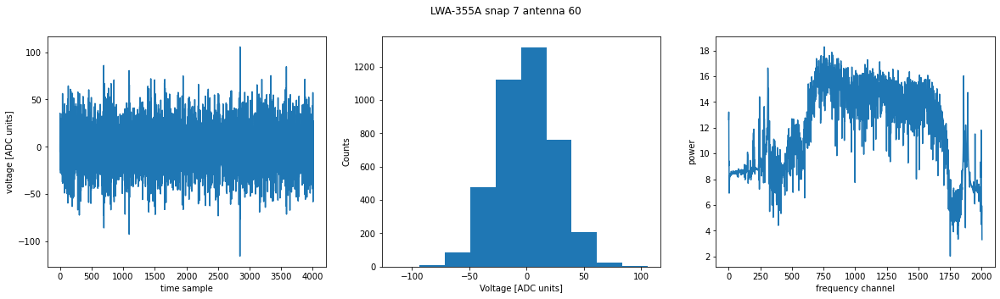

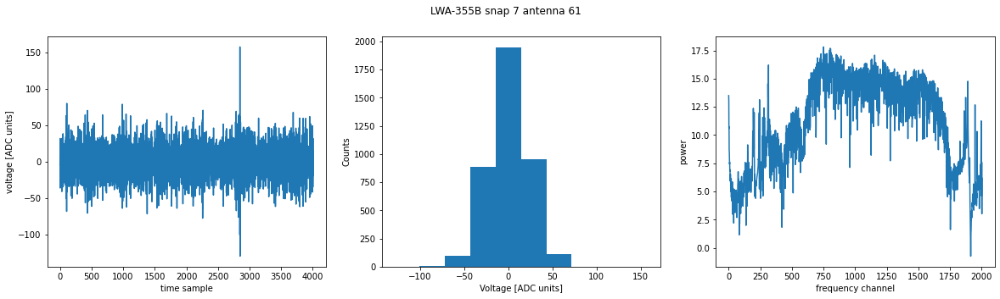

In [610]:
#Calculate indices for a selection of events, so that this uses events from a range of LST but doesn't run on the whole dataset (for runtime reasons)
number_impulsive_events=len(impulsivesummary)
number_events_to_use=10
if number_events_to_use>=number_impulsive_events:
    indices=range(len(number_impulsive_events))
if number_events_to_use<number_impulsive_events:
    indices=np.linspace(0,number_impulsive_events-1,number_events_to_use,dtype=int)

#loop over the selection of events
for i in indices:
    datafname=impulsivesummary['datafname'][i]
    #get the timestamp and convert it to LST
    timestamp=impulsivesummary['timestamp'][i]
    unixtime=timestamp/(fs*1e6)
    timeobject = astropy.time.Time(unixtime, format='unix', location=location)
    lst = timeobject.sidereal_time('apparent').hour
    
    #load the data, calculate the per-antenna summary statistics, and flag antennas
    datafile=datadir+datafname
    index_in_file=impulsivesummary['index_in_file'][i]
    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
    plot_select_antennas(event_records,['LWA-142A','LWA-142B','LWA-010A','LWA-010B','LWA-355A','LWA-355B'],Filter=h)
    

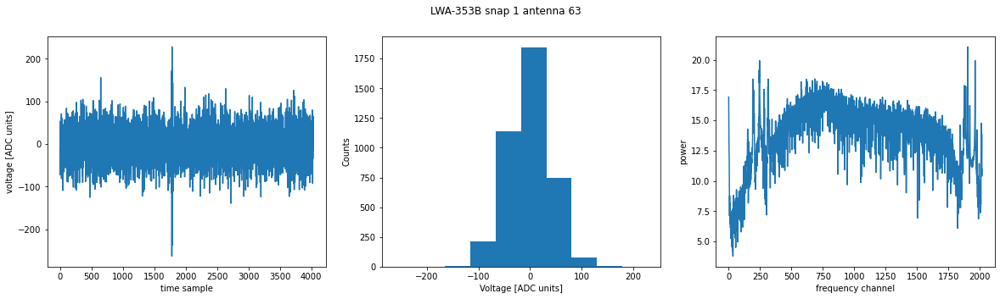

In [599]:
plot_select_antennas(event_records,['LWA-353B'])

In [597]:
mapping.snap2_to_antpol(1,63)

'LWA-353B'

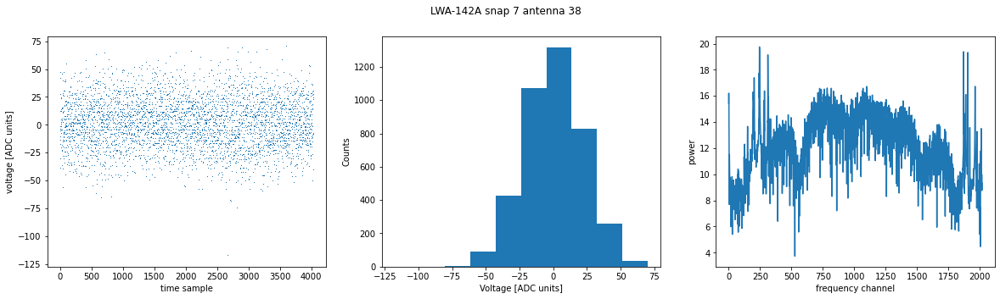

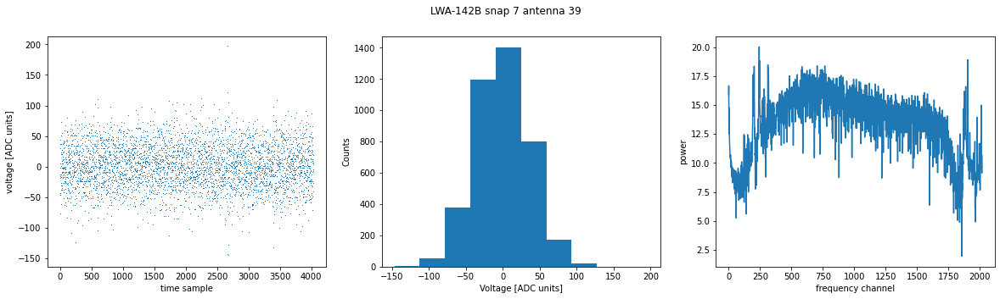

In [608]:
plot_select_antennas(event_records,['LWA-142A','LWA-142B'],Filter=False)

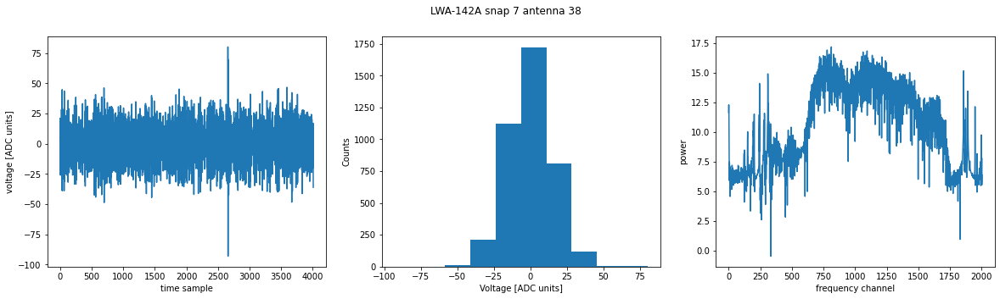

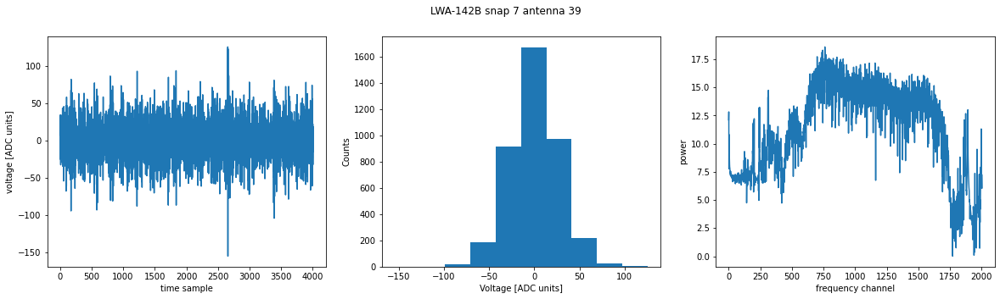

In [604]:
plot_select_antennas(event_records,['LWA-142A','LWA-142B'],Filter=h)

Did not find exactly one antpol for input 1
Did not find exactly one antpol for input 2
Did not find exactly one antpol for input 3
Did not find exactly one antpol for input 4
Did not find exactly one antpol for input 5
Did not find exactly one antpol for input 6
Did not find exactly one antpol for input 7
Did not find exactly one antpol for input 0
Did not find exactly one antpol for input 9
Did not find exactly one antpol for input 10
Did not find exactly one antpol for input 11
Did not find exactly one antpol for input 12
Did not find exactly one antpol for input 13
Did not find exactly one antpol for input 14
Did not find exactly one antpol for input 15
Did not find exactly one antpol for input 8
Did not find exactly one antpol for input 17
Did not find exactly one antpol for input 18
Did not find exactly one antpol for input 19
Did not find exactly one antpol for input 20
Did not find exactly one antpol for input 21
Did not find exactly one antpol for input 22
Did not find exactly

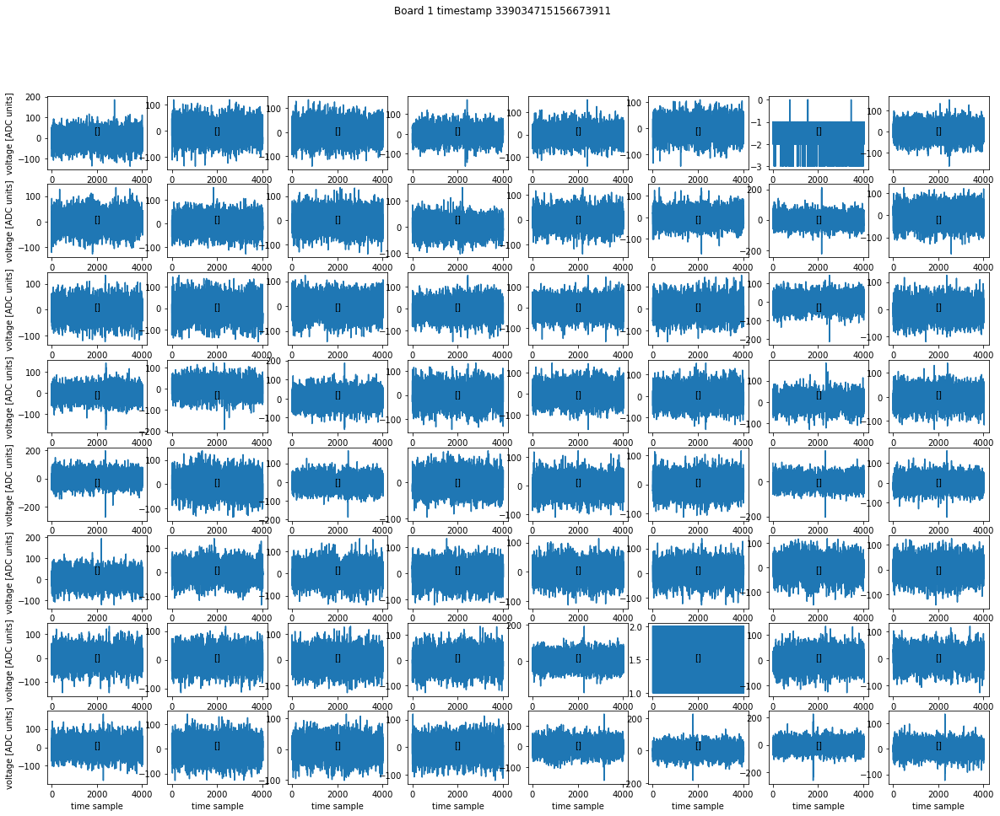

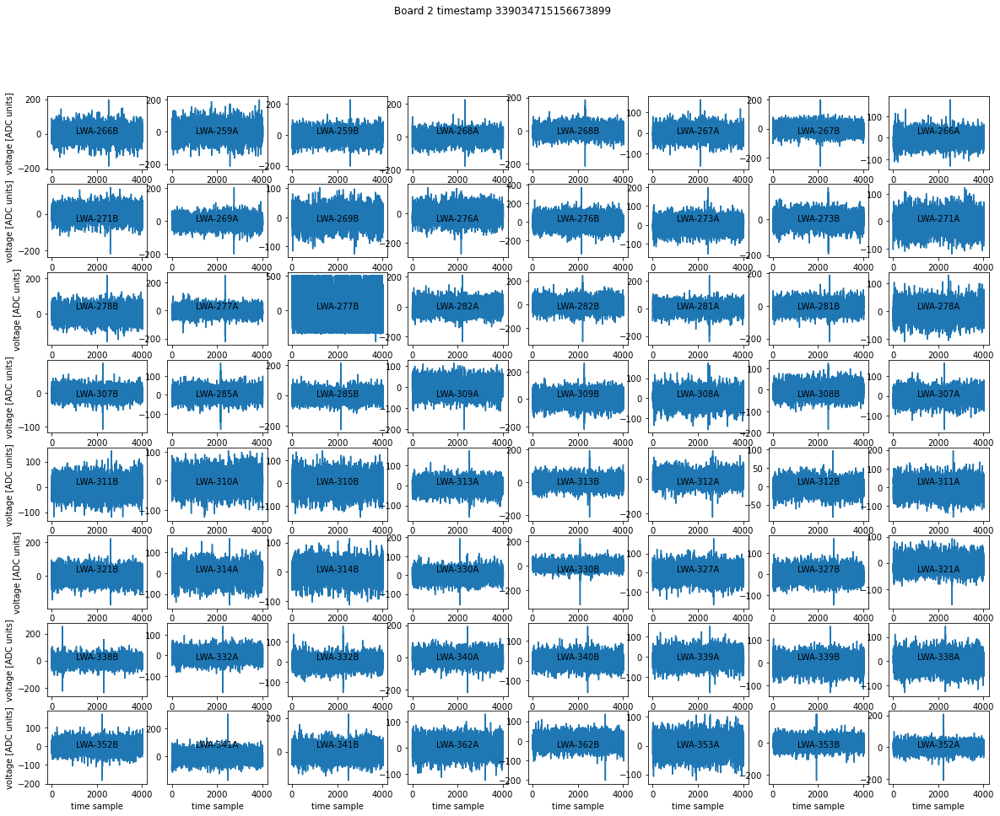

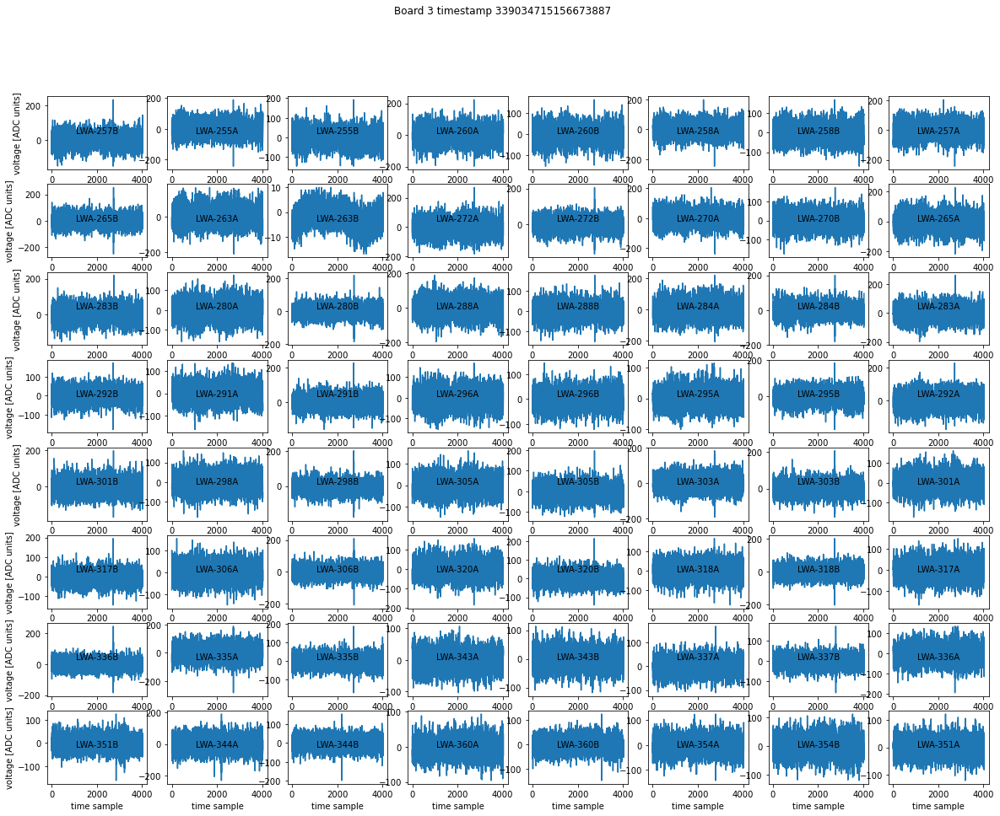

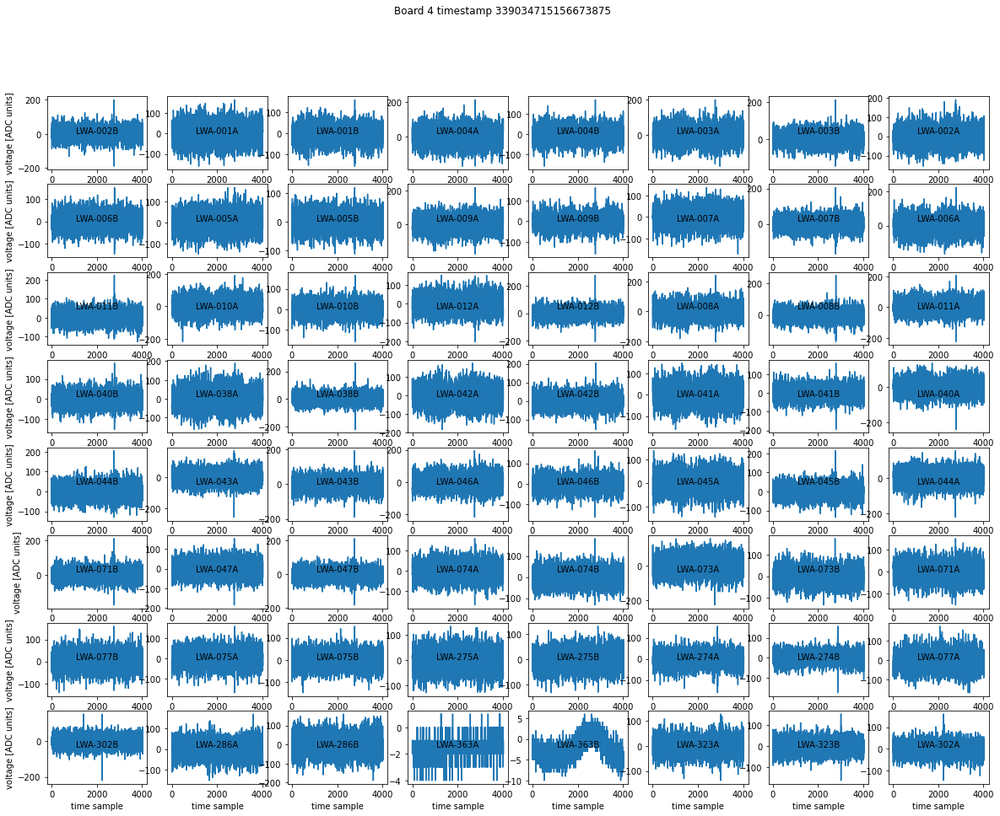

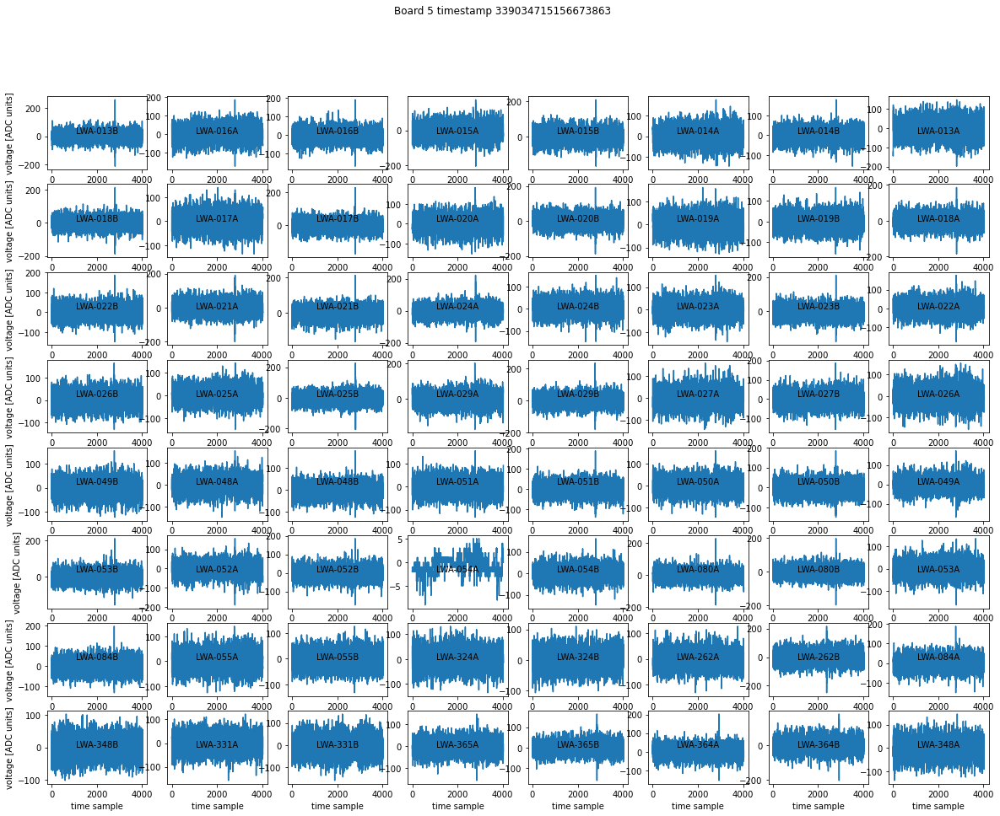

...

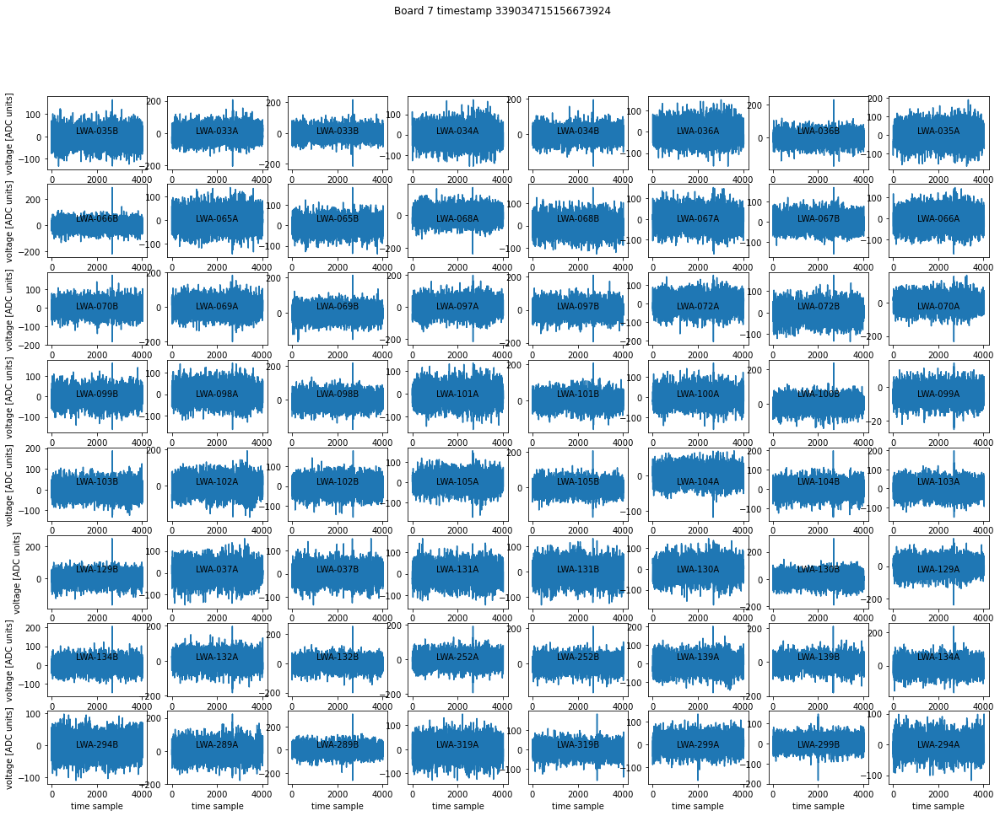

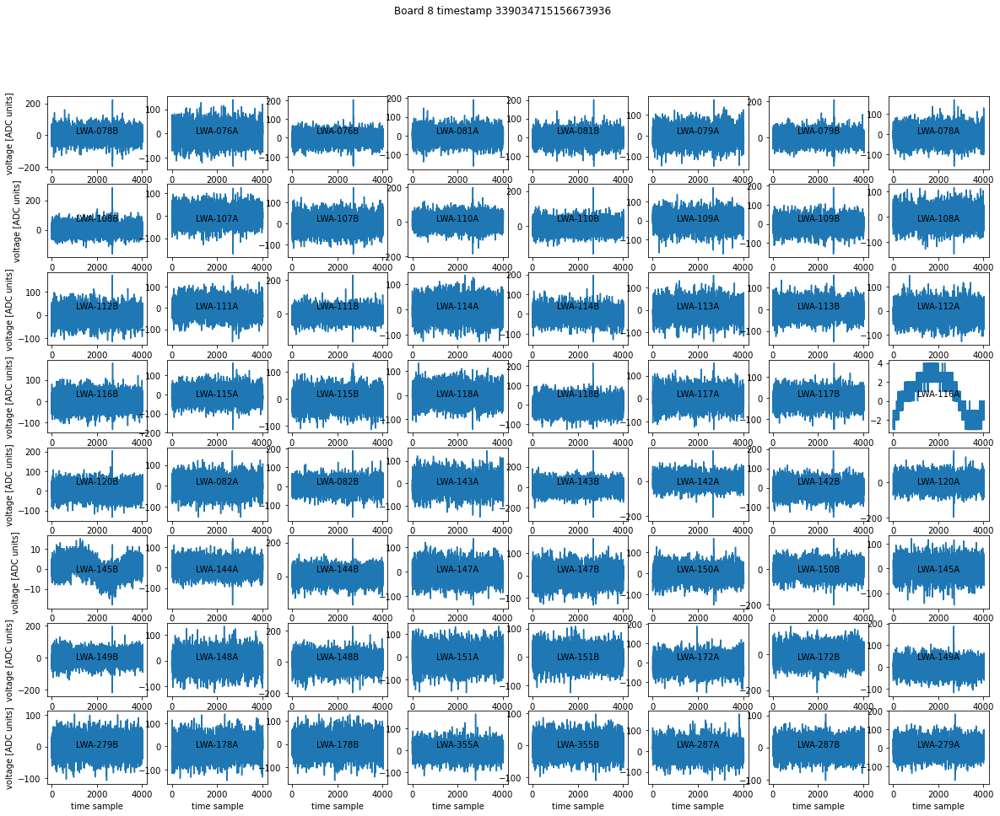

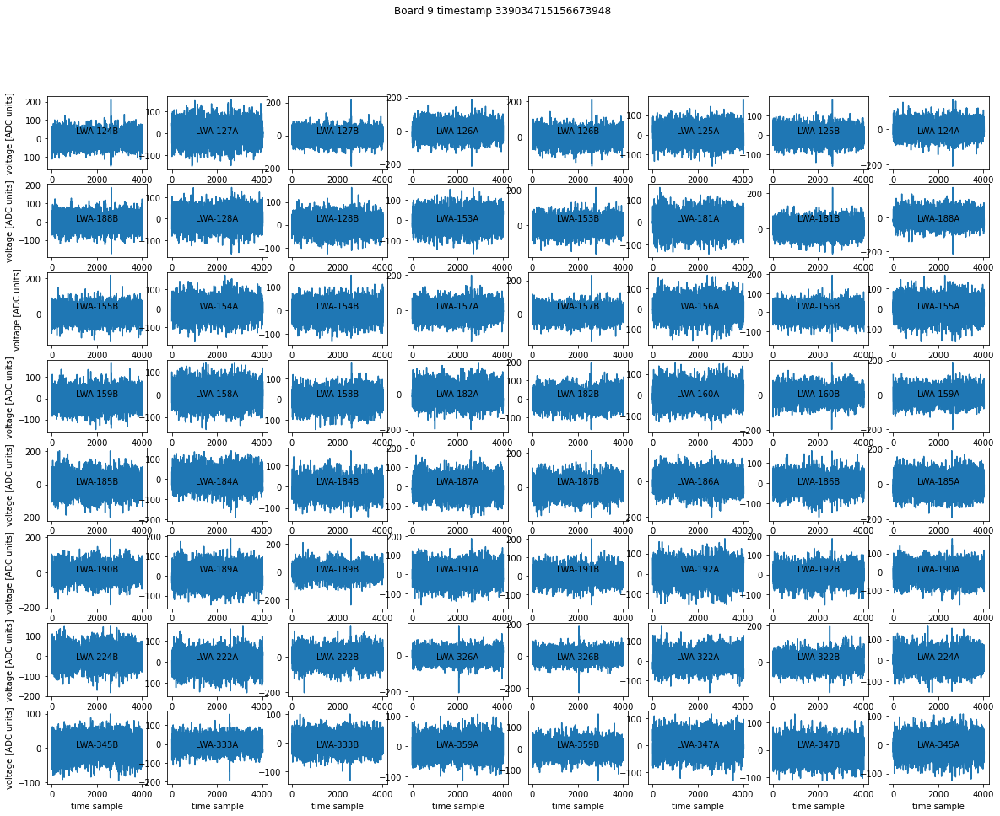

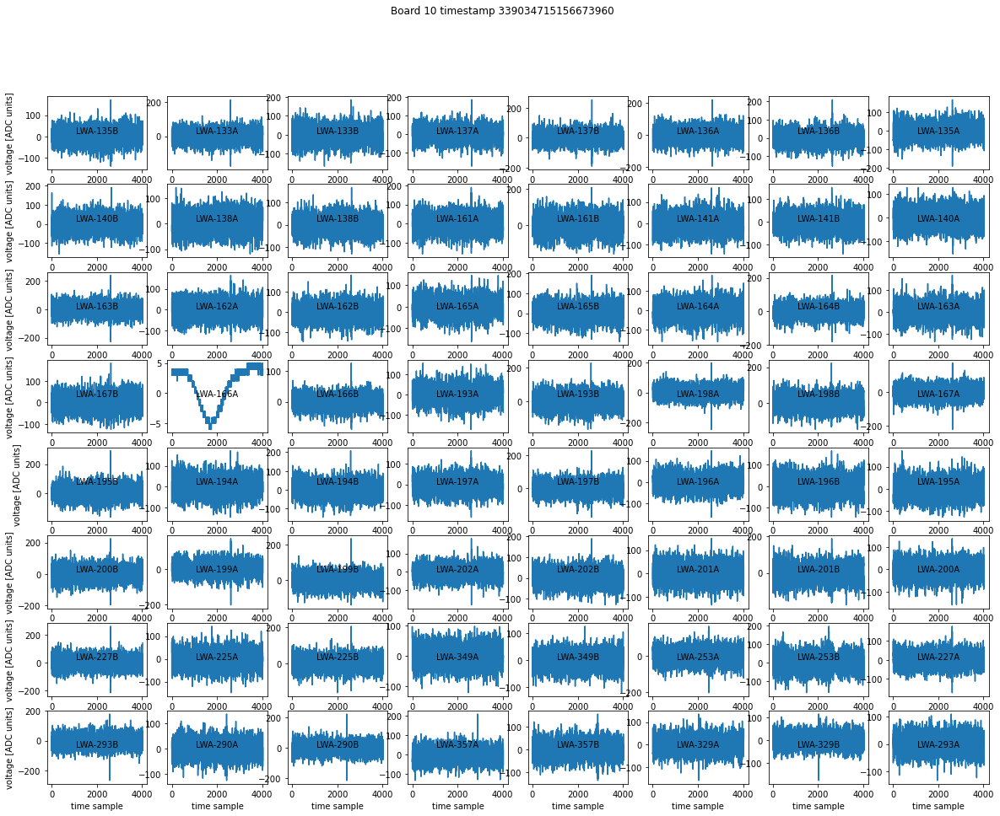

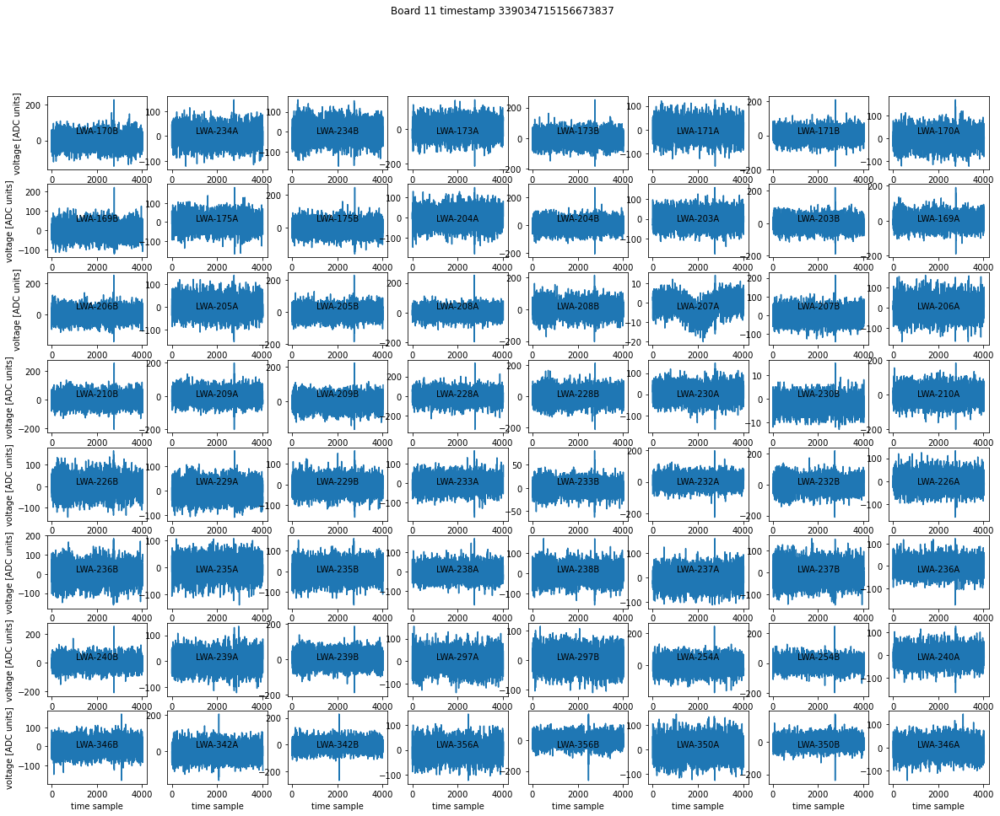

In [583]:
plot_all_timeseries(event_records)

Did not find exactly one antpol for input 1
Did not find exactly one antpol for input 2
Did not find exactly one antpol for input 3
Did not find exactly one antpol for input 4
Did not find exactly one antpol for input 5
Did not find exactly one antpol for input 6
Did not find exactly one antpol for input 7
Did not find exactly one antpol for input 0
Did not find exactly one antpol for input 9
Did not find exactly one antpol for input 10
Did not find exactly one antpol for input 11
Did not find exactly one antpol for input 12
Did not find exactly one antpol for input 13
Did not find exactly one antpol for input 14
Did not find exactly one antpol for input 15
Did not find exactly one antpol for input 8
Did not find exactly one antpol for input 17
Did not find exactly one antpol for input 18
Did not find exactly one antpol for input 19
Did not find exactly one antpol for input 20
Did not find exactly one antpol for input 21
Did not find exactly one antpol for input 22
Did not find exactly

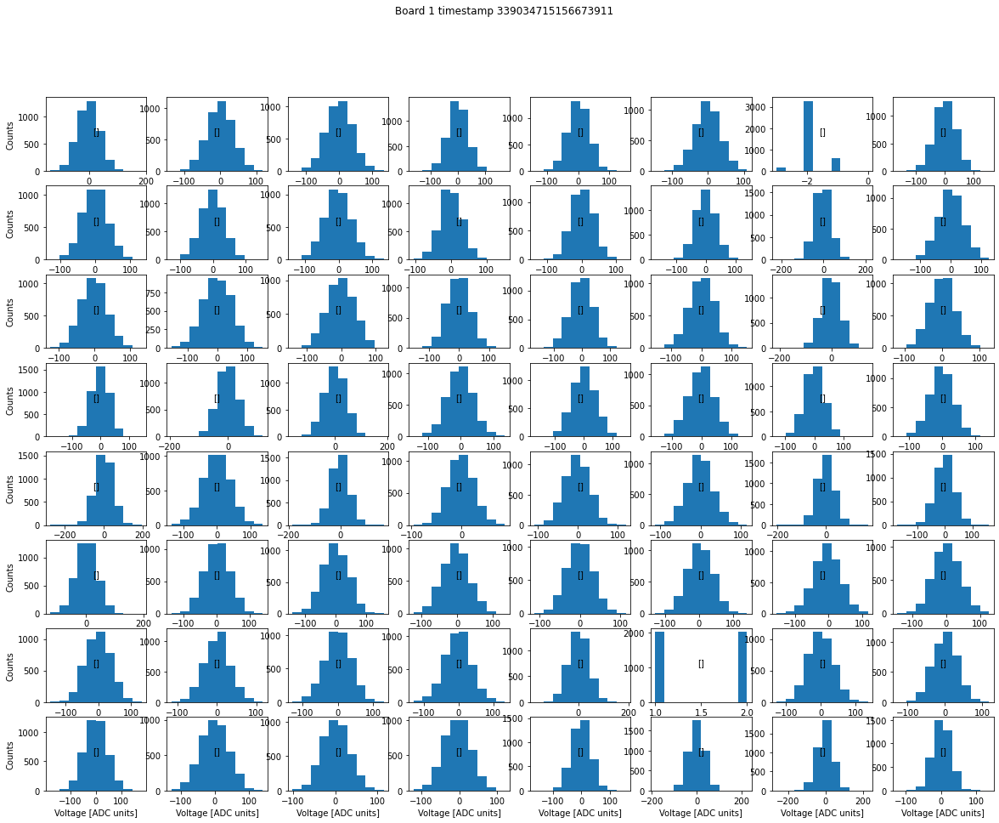

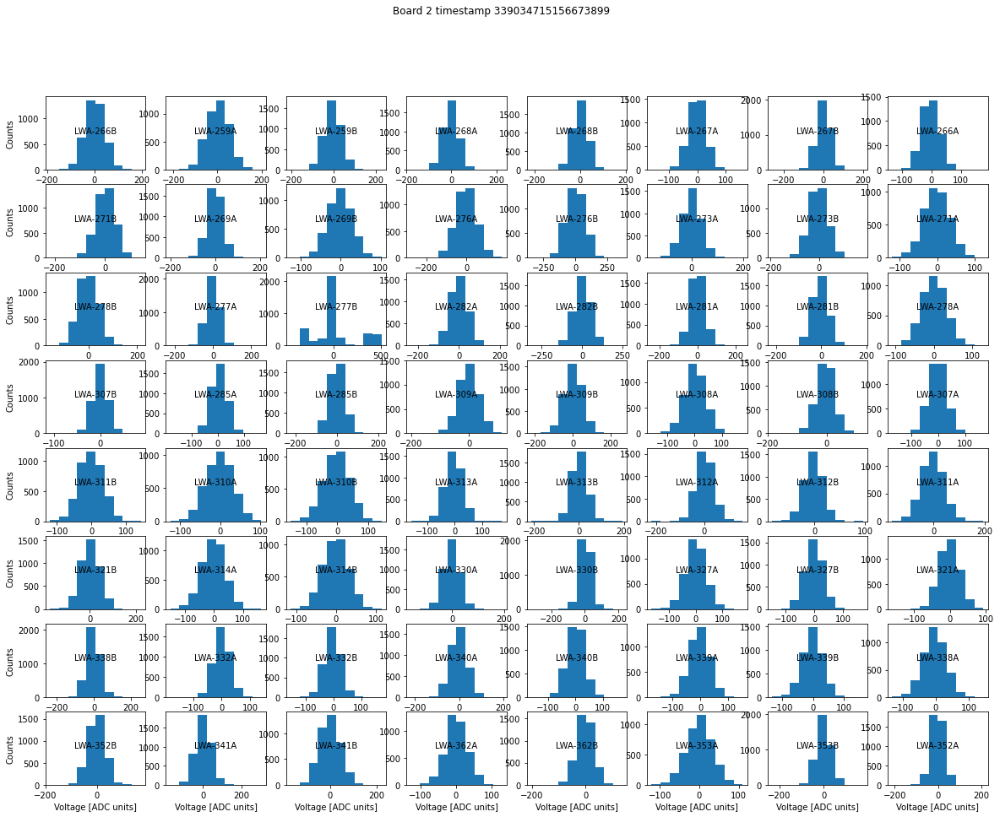

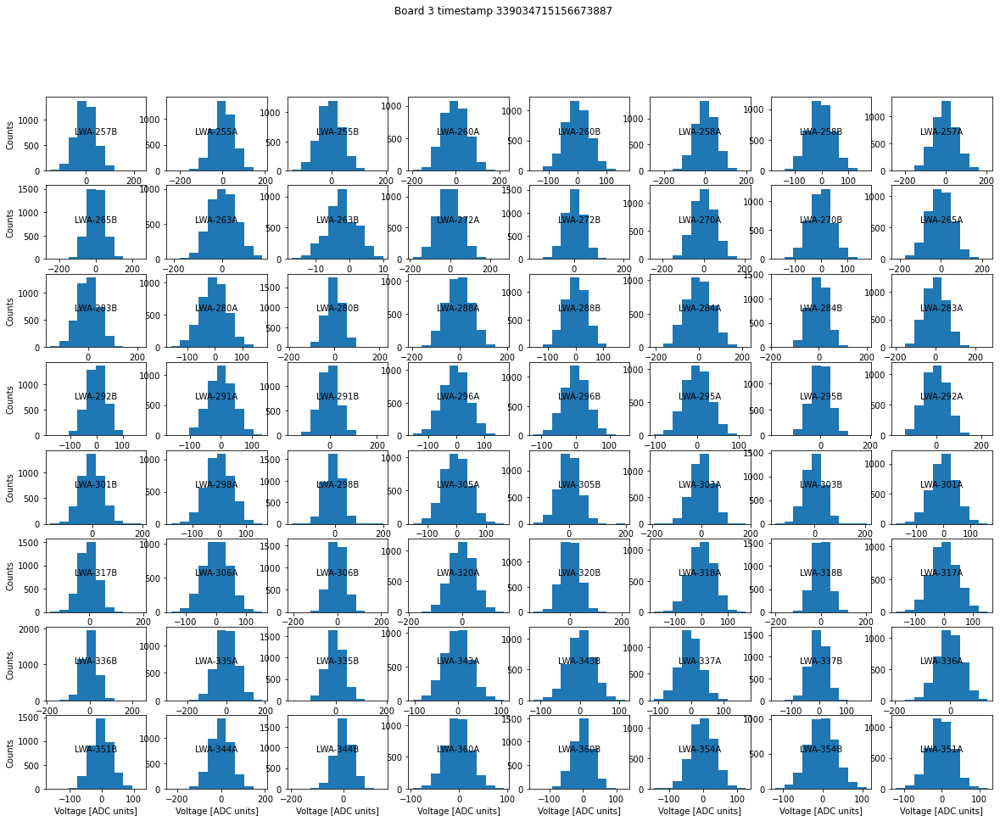

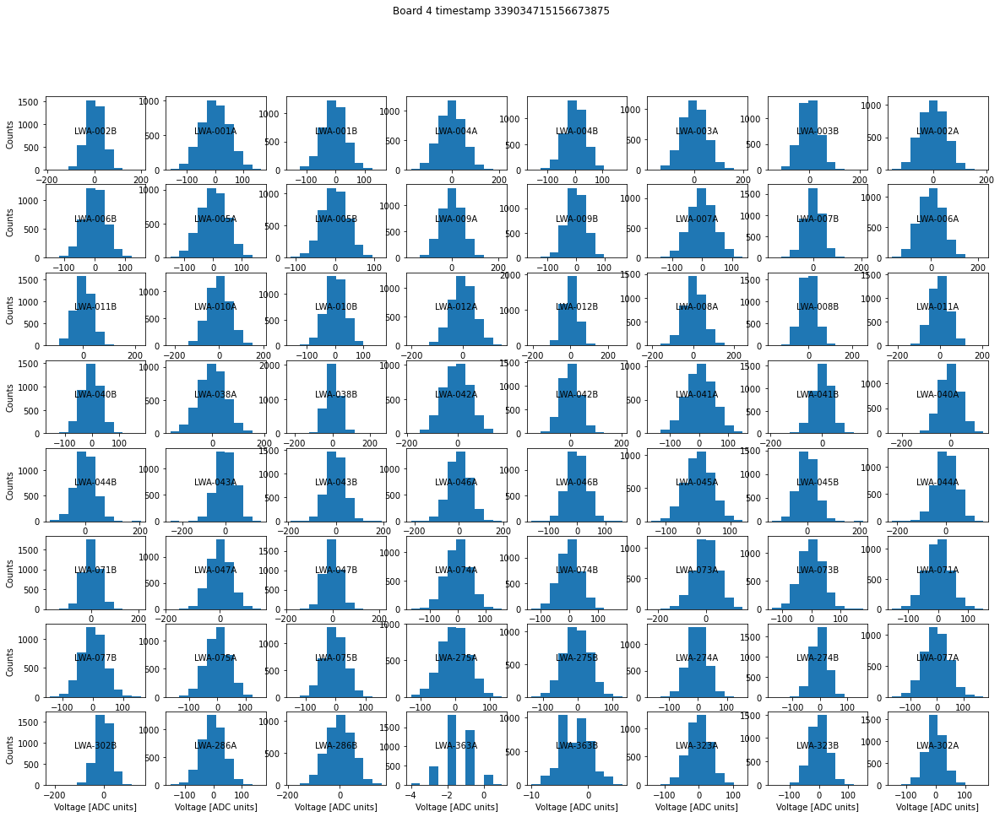

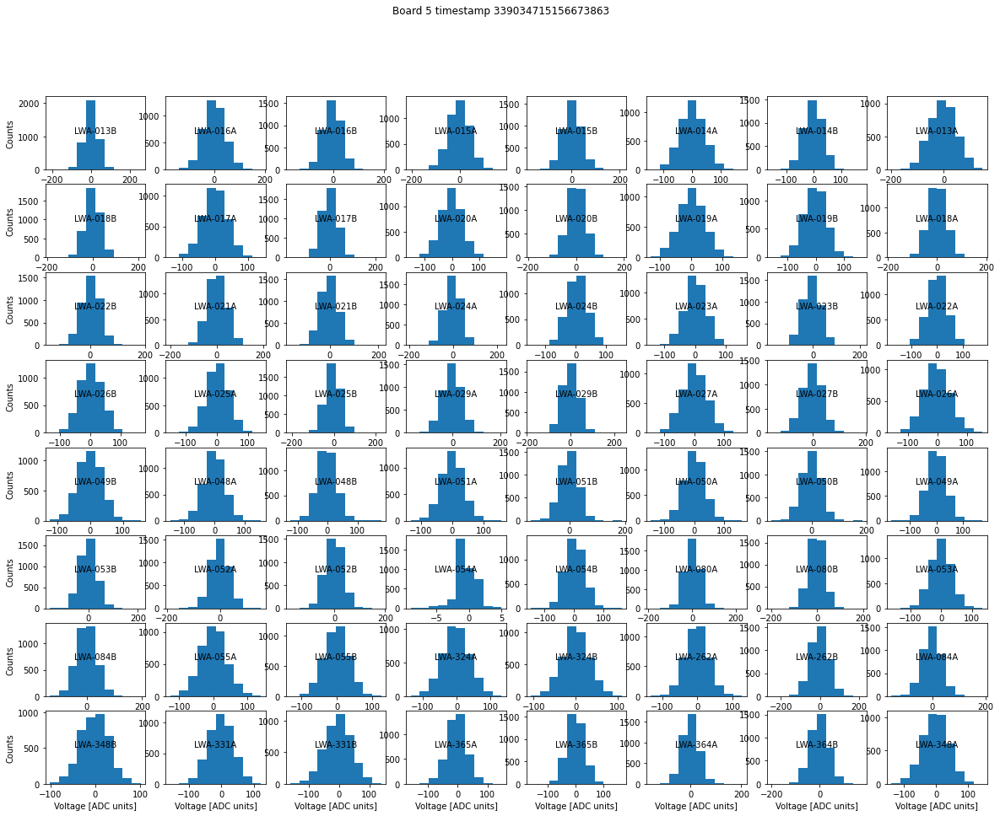

...

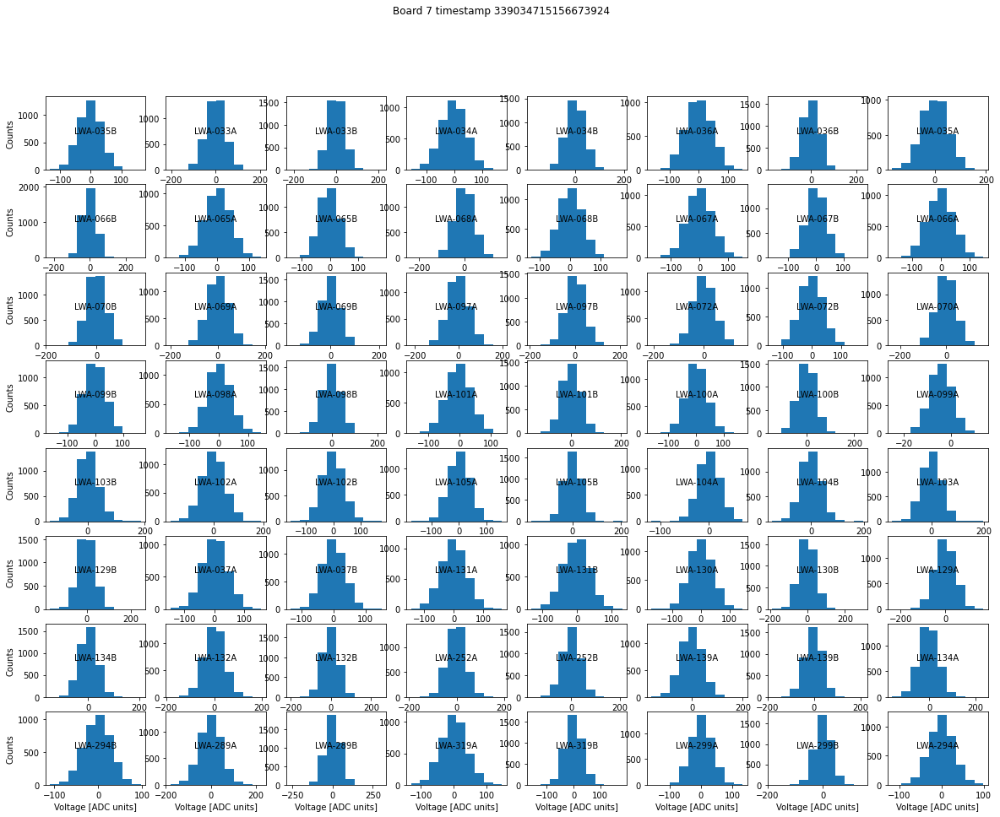

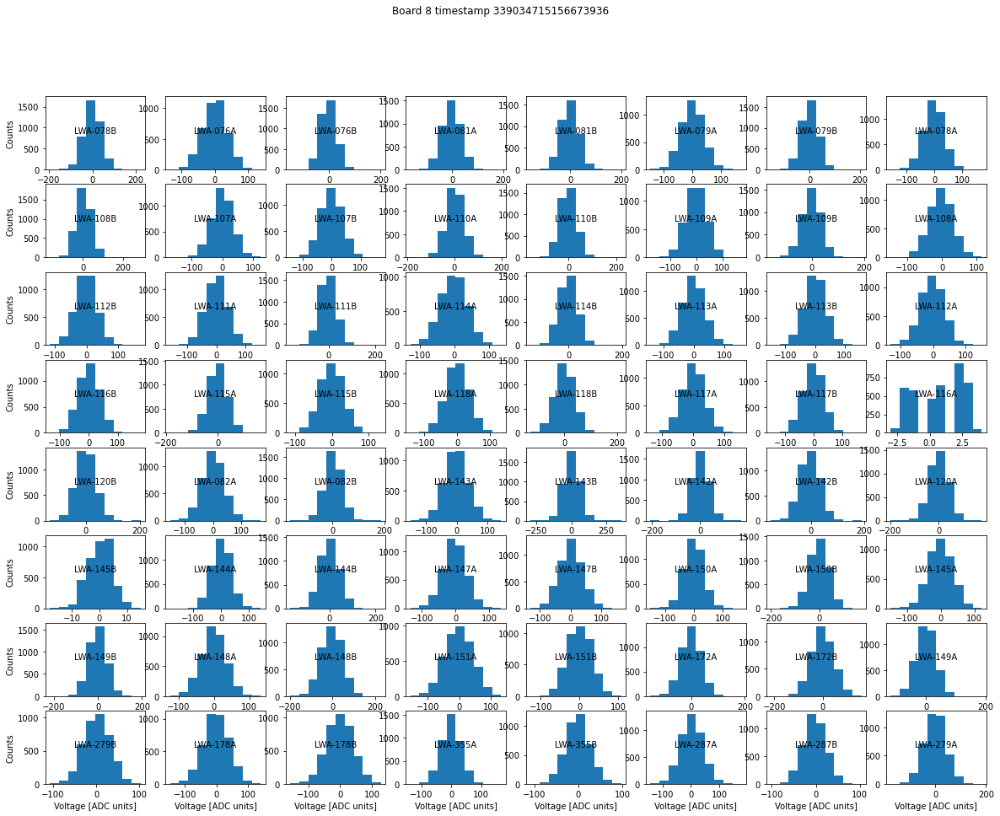

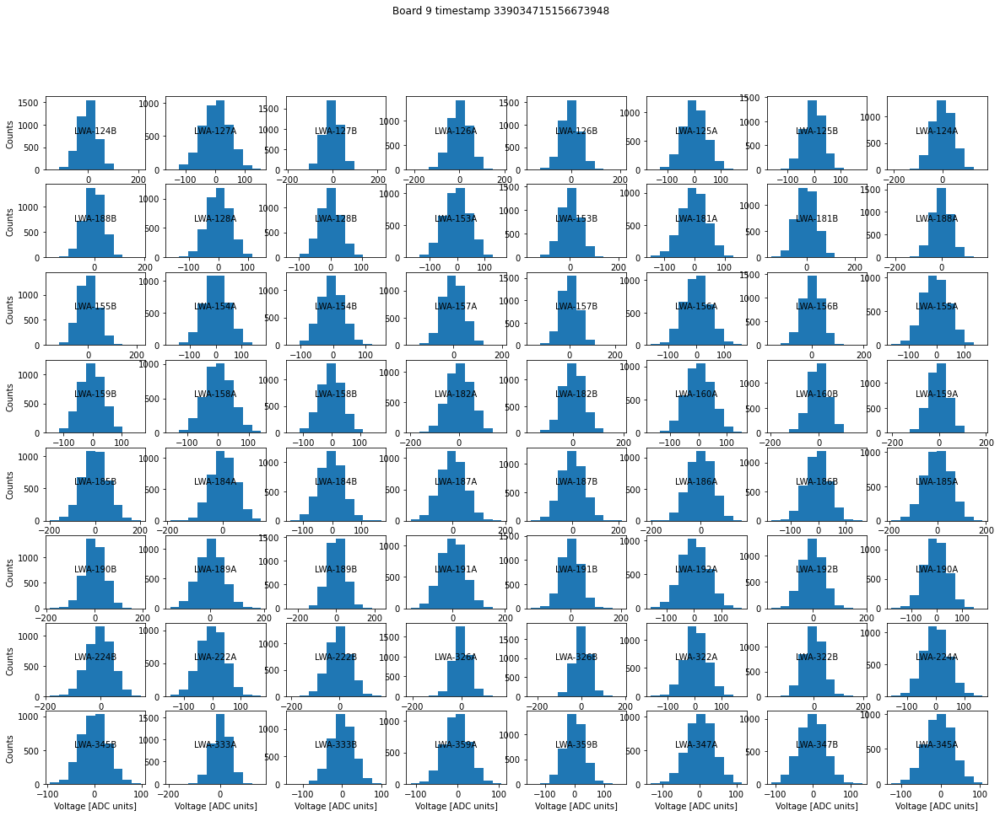

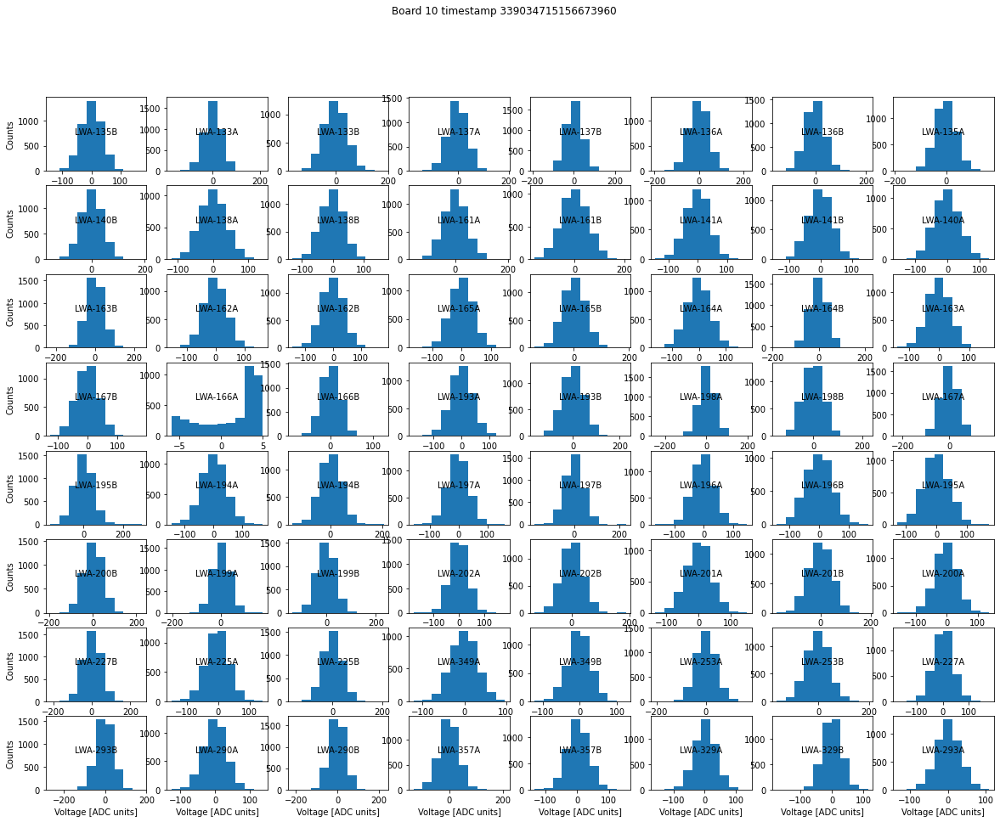

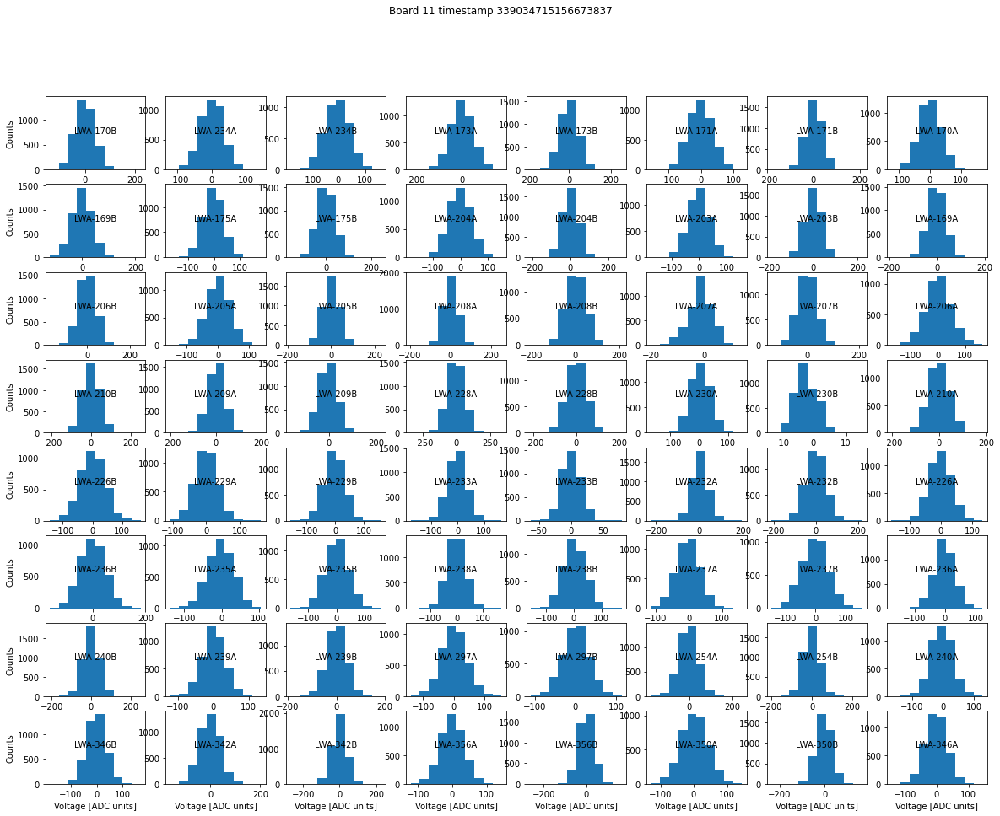

In [584]:
plot_all_histograms(event_records)

Did not find exactly one antpol for input 1
Did not find exactly one antpol for input 2
Did not find exactly one antpol for input 3
Did not find exactly one antpol for input 4
Did not find exactly one antpol for input 5
Did not find exactly one antpol for input 6
Did not find exactly one antpol for input 7
Did not find exactly one antpol for input 0
Did not find exactly one antpol for input 9
Did not find exactly one antpol for input 10
Did not find exactly one antpol for input 11
Did not find exactly one antpol for input 12
Did not find exactly one antpol for input 13
Did not find exactly one antpol for input 14
Did not find exactly one antpol for input 15
Did not find exactly one antpol for input 8
Did not find exactly one antpol for input 17
Did not find exactly one antpol for input 18
Did not find exactly one antpol for input 19
Did not find exactly one antpol for input 20
Did not find exactly one antpol for input 21
Did not find exactly one antpol for input 22
Did not find exactly

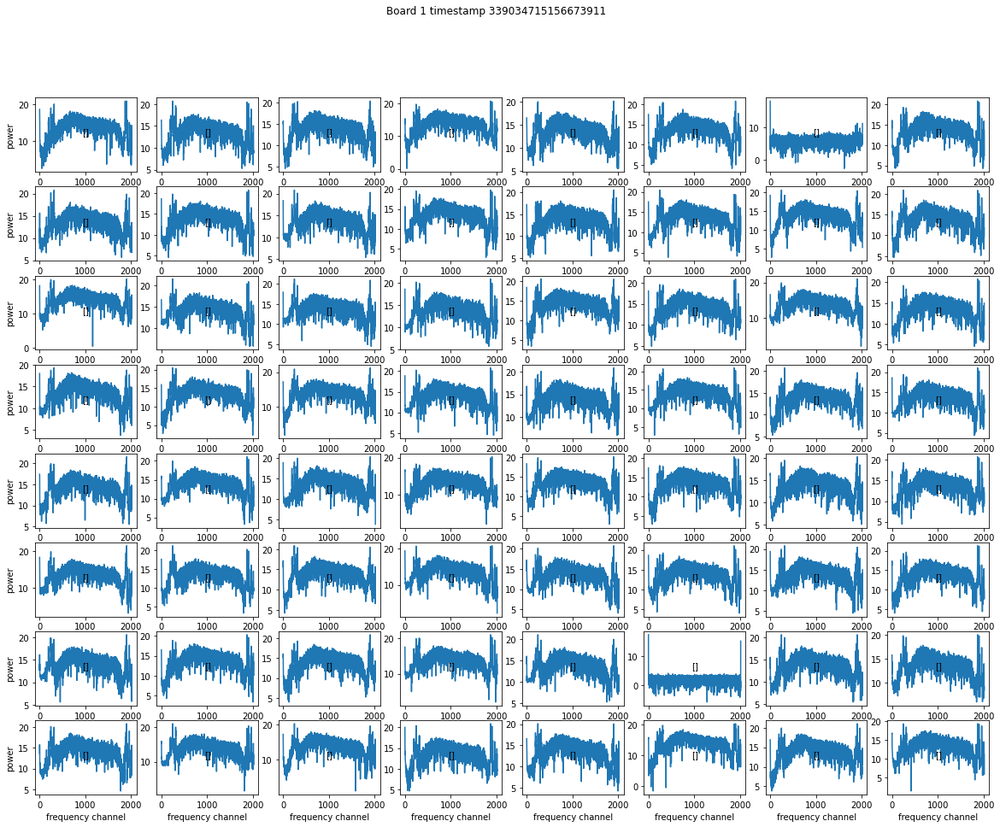

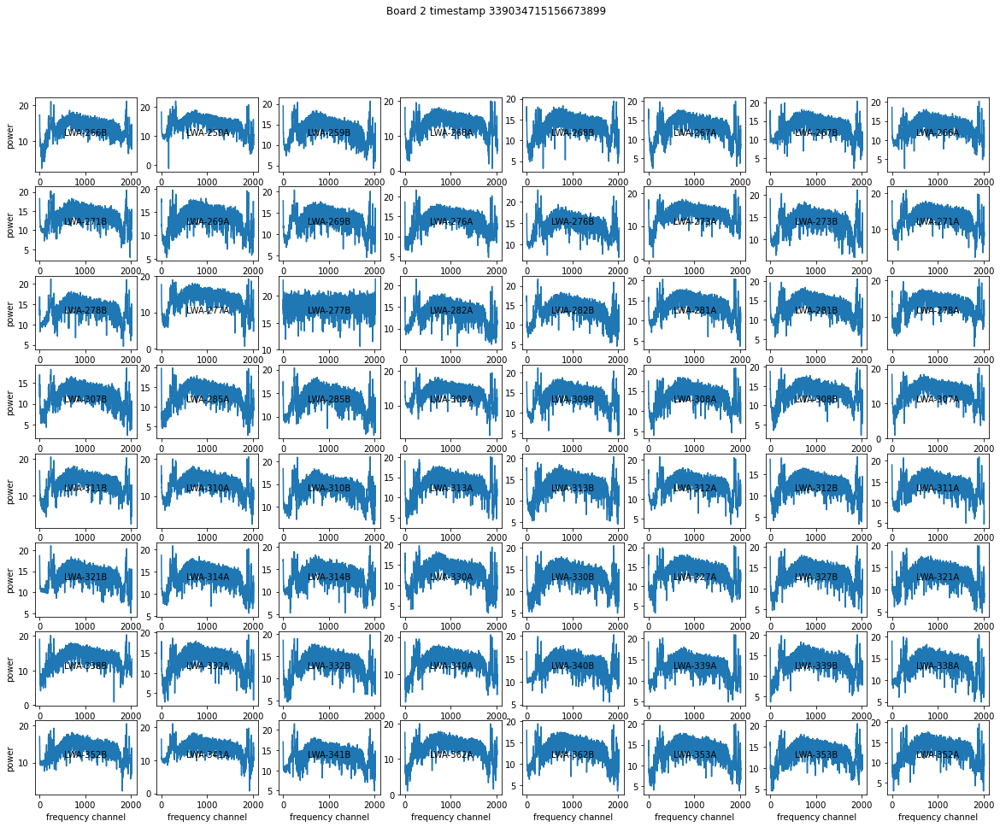

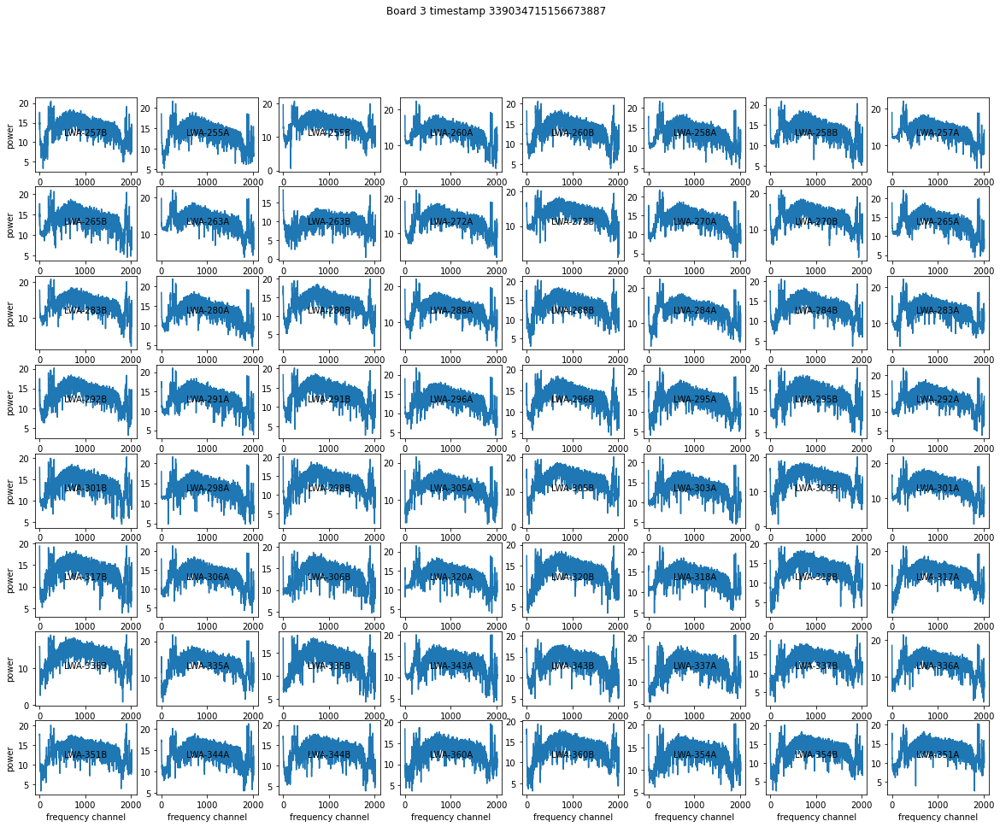

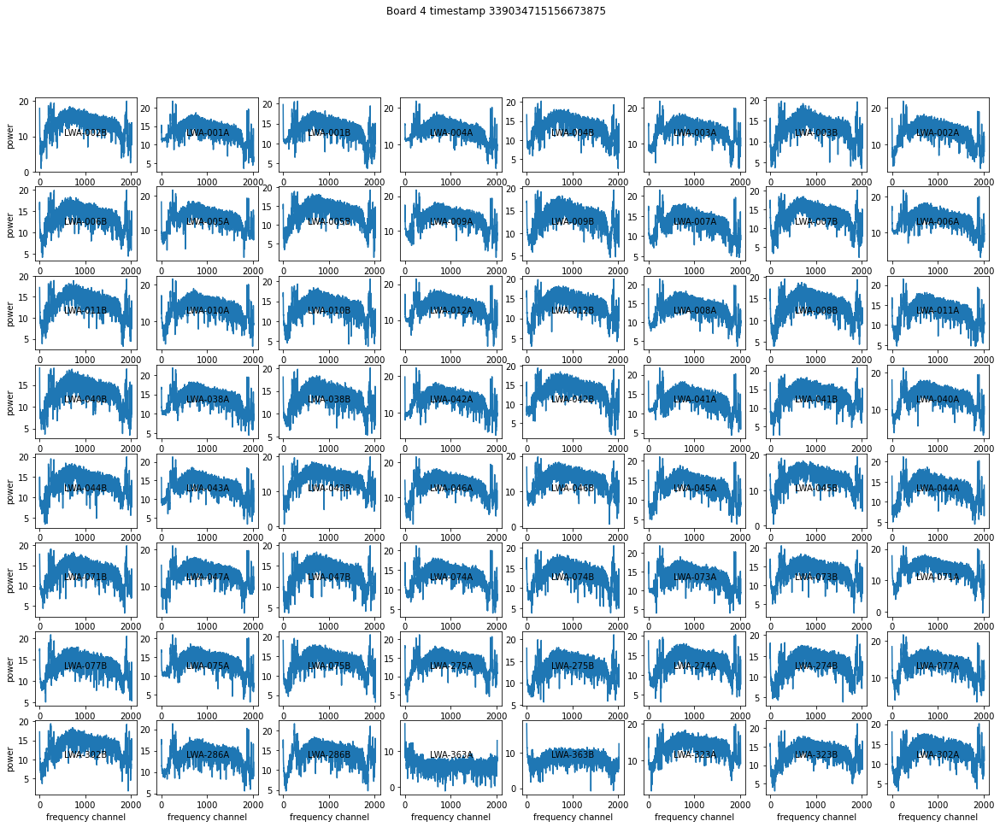

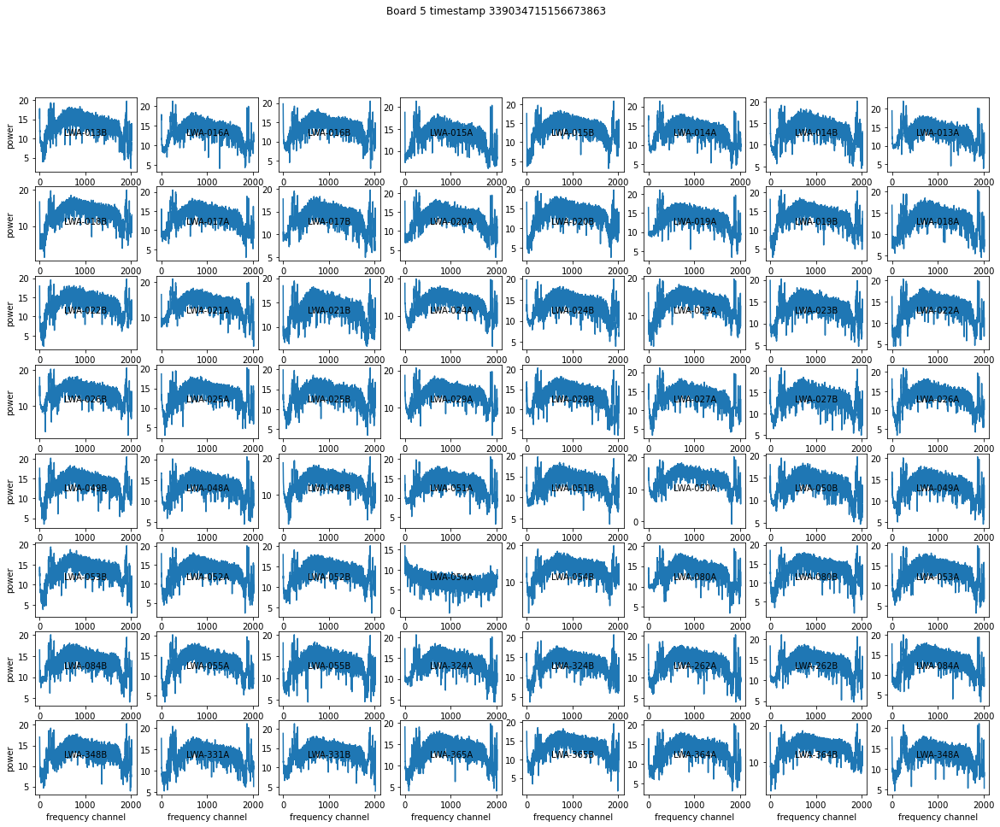

...

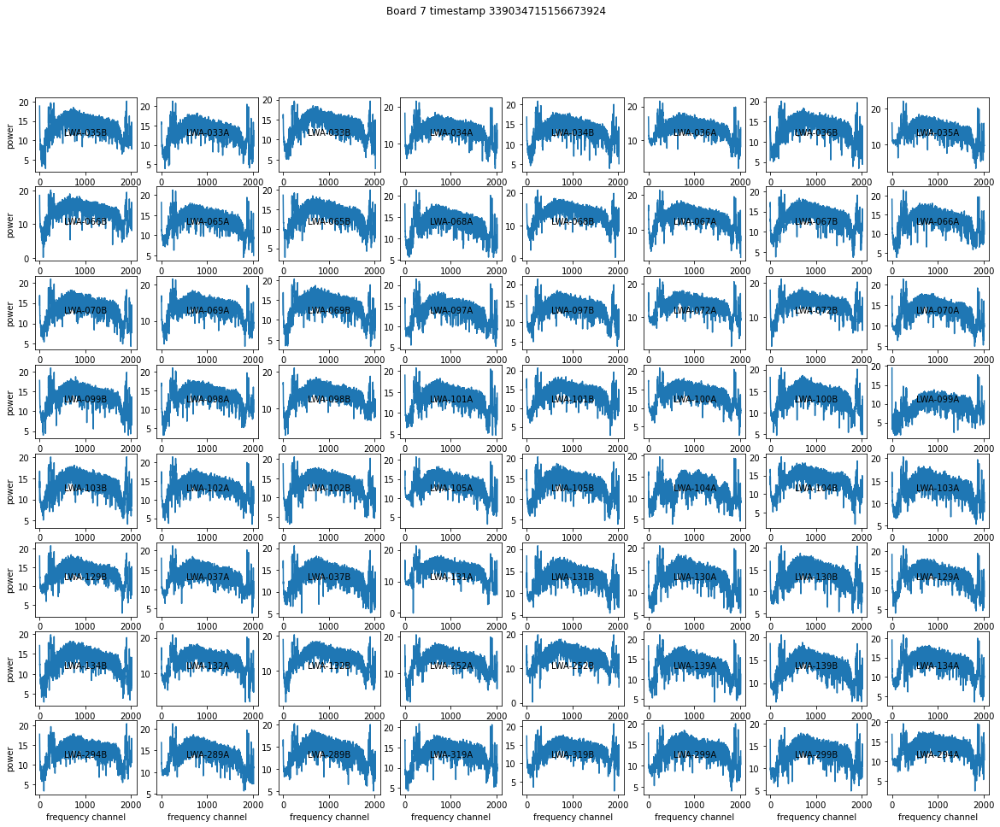

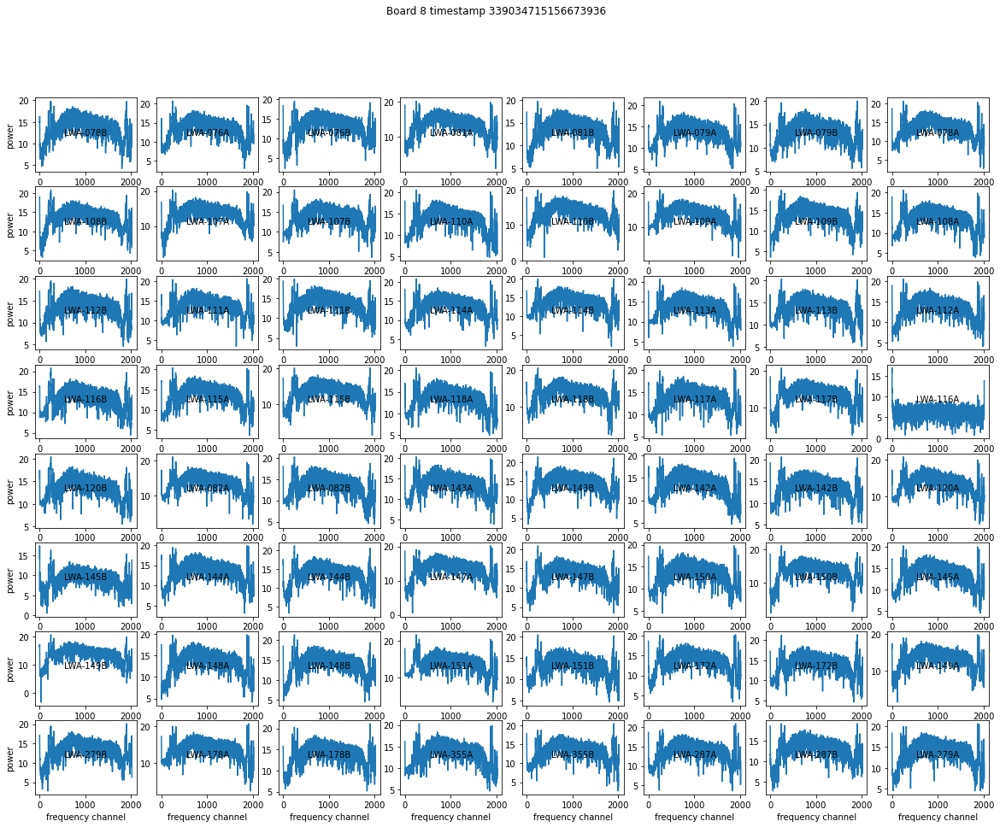

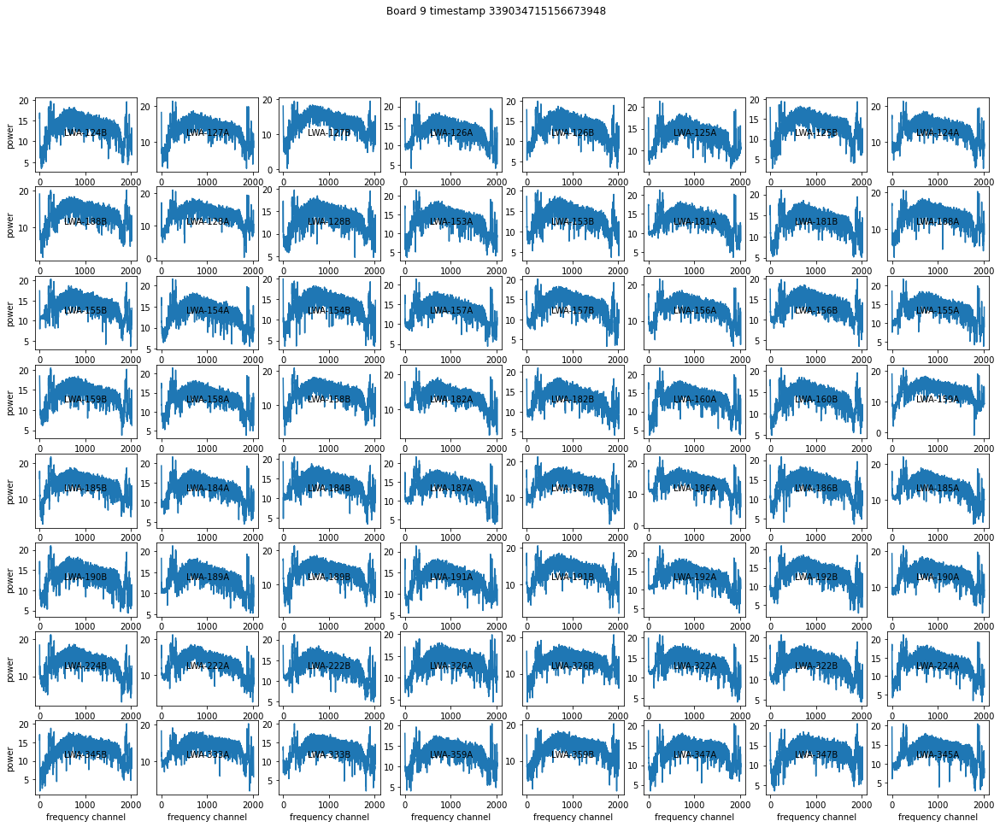

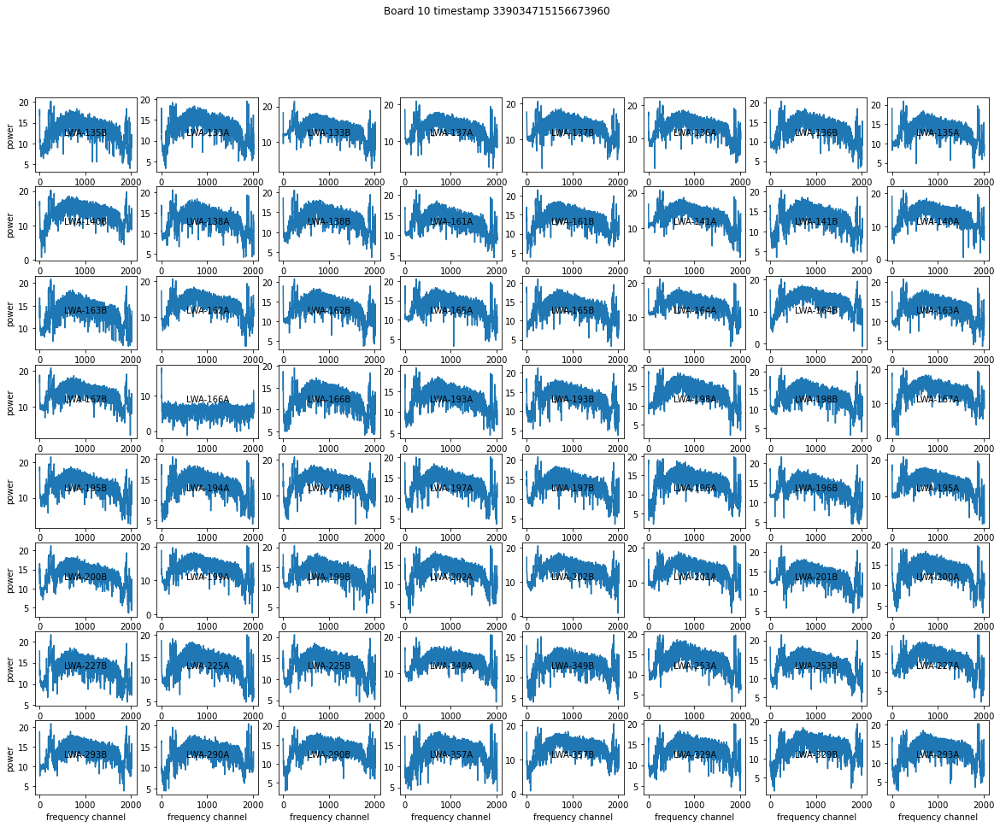

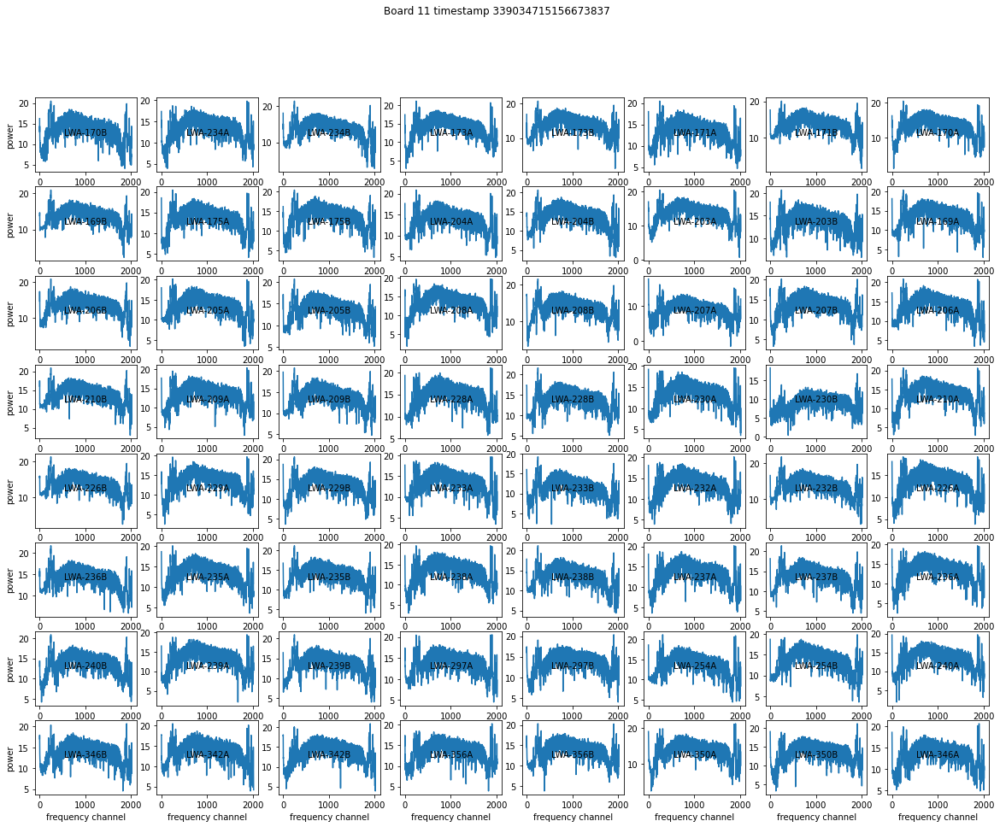

In [585]:
plot_all_spectra(event_records)

# Examine an event with particularly large rms
This occurs at LST= 9.124762107668964  (identified earlier)

In [616]:
timestamps=impulsivesummary['timestamp']
alllsts=np.zeros(len(timestamps))
for i,t in enumerate(timestamps):
    unixtime=t/(fs*1e6)
    timeobject = astropy.time.Time(unixtime, format='unix', location=location)
    lst = timeobject.sidereal_time('apparent').hour
    alllsts[i]=lst



NameError: name 'argmax' is not defined

In [617]:
selectindex=np.argmax(alllsts==9.124762107668964)
print(selectindex,alllsts[selectindex])

29601 9.124762107668964


9.124762107668964


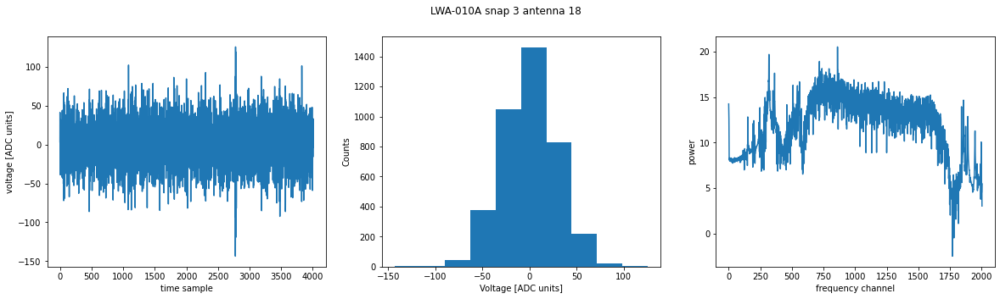

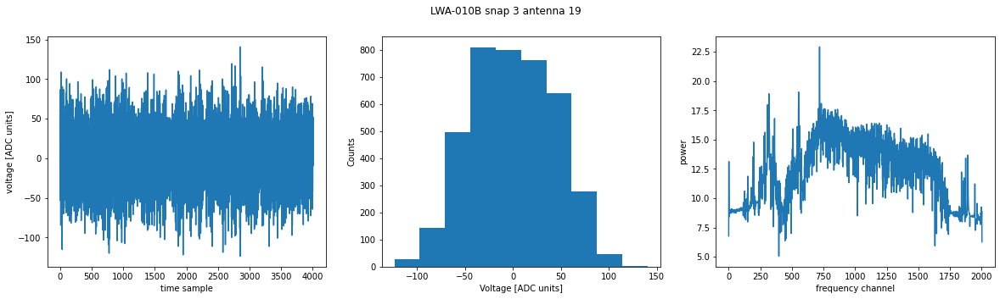

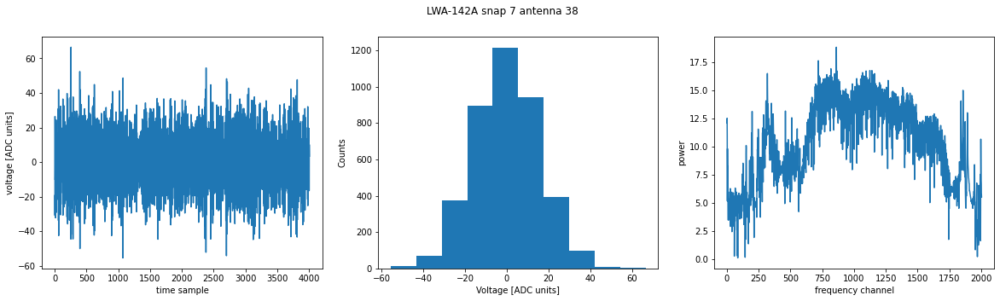

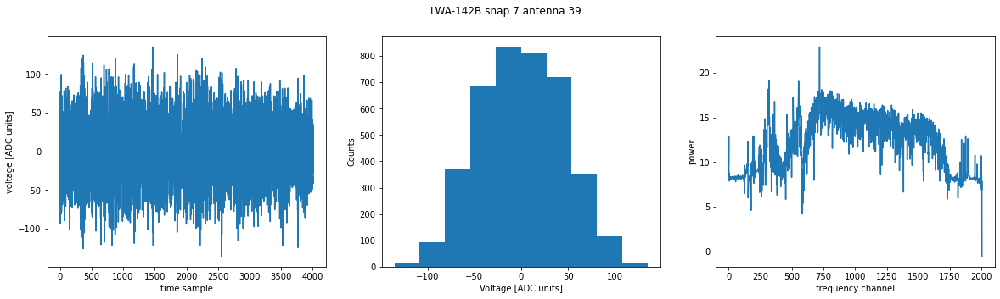

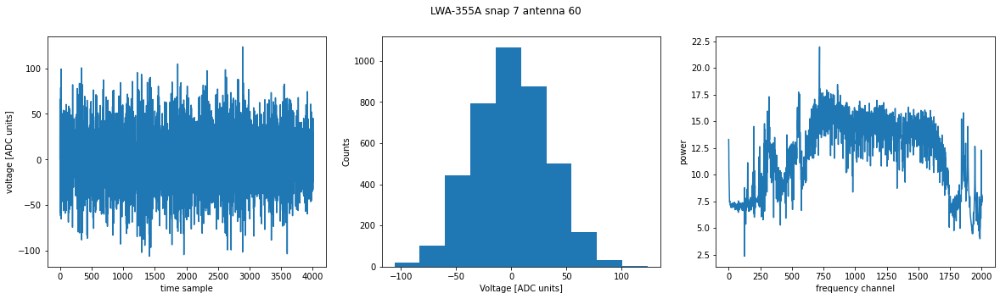

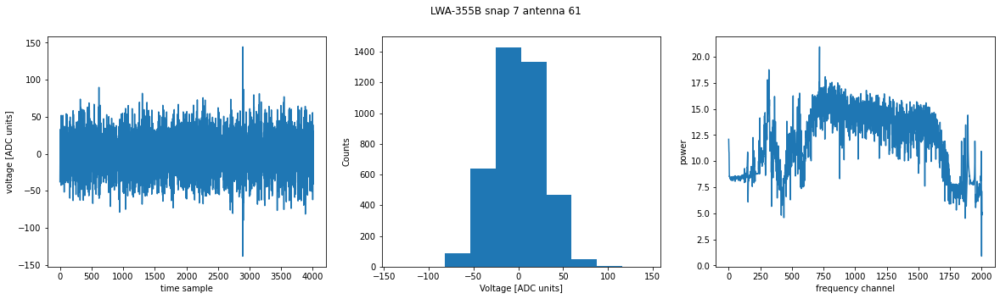

In [618]:
datafname=impulsivesummary['datafname'][selectindex ]
#get the timestamp and convert it to LST
timestamp=impulsivesummary['timestamp'][selectindex ]
unixtime=timestamp/(fs*1e6)
timeobject = astropy.time.Time(unixtime, format='unix', location=location)
lst = timeobject.sidereal_time('apparent').hour
print(lst)
    
#load the data, calculate the per-antenna summary statistics, and flag antennas
datafile=datadir+datafname
index_in_file=impulsivesummary['index_in_file'][selectindex ]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
plot_select_antennas(event_records,['LWA-142A','LWA-142B','LWA-010A','LWA-010B','LWA-355A','LWA-355B'],Filter=h)
    

Conclusion: It has a strong in-band tone, that isn't so strong as to be obvious in the timeseries or the histograms.  Should I automate a way to find "clean" spectra?  Or are these rare enough that they don't matter?

# First try, using other driftcurve script

In [13]:
#want to compare NS, EW, GSM, LFSM, over 24 hour periods at different times of year
lst, T = single_time_driftcurve(time_start=time.time(),pol='NS',lfsm=False)

In [14]:
print(lst,T)

0.0731928485934877 2303.9288022328938


In [5]:
print(lst*24)

1.336335929906678


In [15]:
print(time.time())

1740008296.465656


In [28]:
nsamp=100
tstart=time.time()
duration=24*60*60 #number of seconds in a day
times=tstart+np.linspace(0,duration,nsamp)
T1=np.zeros(nsamp)
T2=np.zeros(nsamp)
T3=np.zeros(nsamp)
T4=np.zeros(nsamp)

for i in range(len(times)):
    lst,T1[i]=single_time_driftcurve(time_start=times[i],pol='NS',lfsm=True,frequency=70e6)
    lst,T2[i]=single_time_driftcurve(time_start=times[i],pol='NS',lfsm=False,frequency=70e6)
    lst,T3[i]=single_time_driftcurve(time_start=times[i],pol='EW',lfsm=True,frequency=70e6)
    lst,T4[i]=single_time_driftcurve(time_start=times[i],pol='EW',lfsm=False,frequency=70e6)

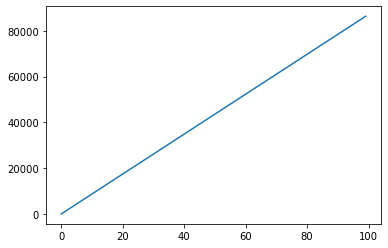

In [32]:
plt.plot(times-tstart)

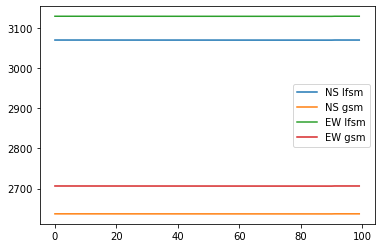

In [31]:
plt.plot(T1,label='NS lfsm')
plt.plot(T2,label='NS gsm')
plt.plot(T3,label='EW lfsm')
plt.plot(T4,label='EW gsm')
plt.legend()

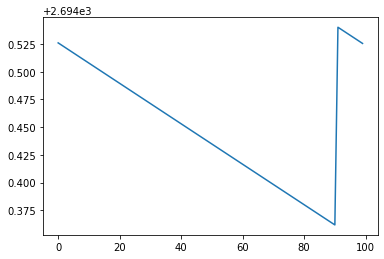

In [24]:
plt.plot(T1)


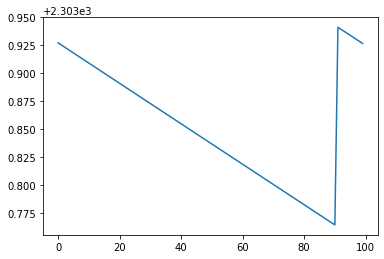

In [25]:
plt.plot(T2)


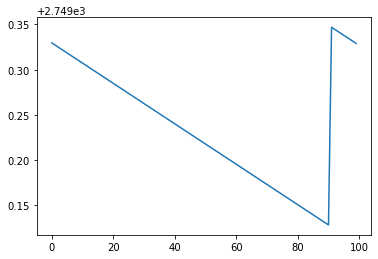

In [26]:
plt.plot(T3)

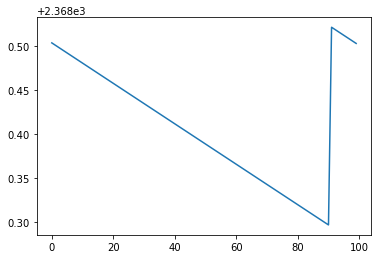

In [27]:
plt.plot(T4)